In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
df = pd.read_csv("owid-covid-data.csv")
df

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166321,ZWE,Africa,Zimbabwe,2022-03-01,236871.0,491.0,413.000,5395.0,0.0,1.000,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
166322,ZWE,Africa,Zimbabwe,2022-03-02,237503.0,632.0,416.286,5396.0,1.0,1.143,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
166323,ZWE,Africa,Zimbabwe,2022-03-03,237503.0,0.0,362.286,5396.0,0.0,0.857,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
166324,ZWE,Africa,Zimbabwe,2022-03-04,238739.0,1236.0,467.429,5397.0,1.0,0.714,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN


In [3]:
# Selecting a single representative country for each continent. Representative country was selected based on population size.

USA_data = df[df['location'] == 'United States']
USA_data = USA_data.set_index('date')
Brazil_data = df[df['location'] == 'Brazil']
Brazil_data = Brazil_data.set_index('date')
Germany_data = df[df['location'] == 'Germany']
Germany_data = Germany_data.set_index('date')
China_data = df[df['location'] == 'China']
China_data = China_data.set_index('date')
Nigeria_data = df[df['location'] == 'Nigeria']
Nigeria_data = Nigeria_data.set_index('date')
Australia_data = df[df['location'] == 'Australia']
Australia_data = Australia_data.set_index('date')

In [4]:
# Manually spliting the train and test data where "train" is all data from 2020-2021 and "test" is all data from 2022.

USA_train = USA_data[0:710]
USA_test = USA_data[710:]
Brazil_train = Brazil_data[0:675]
Brazil_test = Brazil_data[675:]
Germany_train = Germany_data[0:705]
Germany_test = Germany_data[705:]
China_train = China_data[0:710]
China_test = China_data[710:]
Nigeria_train = Nigeria_data[0:673]
Nigeria_test = Nigeria_data[673:]
Australia_train = Australia_data[0:706]
Australia_test = Australia_data[706:]

In [5]:
df.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

# Vaccinations

Many countries are missing vaccination data only within an initial time period (about a 1 year delay), but are generally complete going forward. Each of the countries will be check to verify this information, and may be chosen as predictors despite higher missingness proportions. We anticipate our models to be robust to this specific pattern of missingness.

# USA

In [6]:
missing_USA = pd.DataFrame(USA_train.isnull().sum())
missing_USA['% missing'] = USA_train.isnull().sum()/USA_train.shape[0]
missing_USA.columns = ["Missing Count", "Proportion Missing"]
missing_USA = missing_USA.sort_values(by="Proportion Missing", ascending=True)
missing_USA = missing_USA[missing_USA["Proportion Missing"] < .50]
print(missing_USA.shape)
missing_USA

(57, 2)


,Missing Count,Proportion Missing
iso_code,0,0.000000
population_density,0,0.000000
median_age,0,0.000000
aged_65_older,0,0.000000
aged_70_older,0,0.000000
gdp_per_capita,0,0.000000
extreme_poverty,0,0.000000
cardiovasc_death_rate,0,0.000000
diabetes_prevalence,0,0.000000
female_smokers,0,0.000000


In [7]:
# Selecting predictors with adequate missingness

selected_USA = missing_USA.index
USA_train = USA_train[selected_USA] 
USA_test = USA_test[selected_USA] 

# Brazil

In [8]:
missing_Brazil = pd.DataFrame(Brazil_train.isnull().sum())
missing_Brazil['% missing'] = Brazil_train.isnull().sum()/Brazil_train.shape[0]
missing_Brazil.columns = ["Missing Count", "Proportion Missing"]
missing_Brazil = missing_Brazil.sort_values(by="Proportion Missing", ascending=True)
missing_Brazil = missing_Brazil[missing_Brazil["Proportion Missing"] < .50]
print(missing_Brazil.shape)
missing_Brazil

(45, 2)


,Missing Count,Proportion Missing
iso_code,0,0.000000
population_density,0,0.000000
median_age,0,0.000000
aged_65_older,0,0.000000
aged_70_older,0,0.000000
gdp_per_capita,0,0.000000
extreme_poverty,0,0.000000
cardiovasc_death_rate,0,0.000000
diabetes_prevalence,0,0.000000
female_smokers,0,0.000000


In [9]:
# Selecting predictors with adequate missingness

selected_Brazil = missing_Brazil.index
Brazil_train = Brazil_train[selected_Brazil] 
Brazil_test = Brazil_test[selected_Brazil] 

# Germany

In [10]:
missing_Germany = pd.DataFrame(Germany_train.isnull().sum())
missing_Germany['% missing'] = Germany_train.isnull().sum()/Germany_train.shape[0]
missing_Germany.columns = ["Missing Count", "Proportion Missing"]
missing_Germany = missing_Germany.sort_values(by="Proportion Missing", ascending=True)
missing_Germany = missing_Germany[missing_Germany["Proportion Missing"] < .50]
print(missing_Germany.shape)
missing_Germany

(50, 2)


,Missing Count,Proportion Missing
iso_code,0,0.000000
population_density,0,0.000000
median_age,0,0.000000
aged_65_older,0,0.000000
aged_70_older,0,0.000000
gdp_per_capita,0,0.000000
cardiovasc_death_rate,0,0.000000
diabetes_prevalence,0,0.000000
female_smokers,0,0.000000
male_smokers,0,0.000000


In [11]:
# Selecting predictors with adequate missingness

selected_Germany = missing_Germany.index
Germany_train = Germany_train[selected_Germany] 
Germany_test = Germany_test[selected_Germany] 

# China

In [12]:
missing_China = pd.DataFrame(China_train.isnull().sum())
missing_China['% missing'] = China_train.isnull().sum()/China_train.shape[0]
missing_China.columns = ["Missing Count", "Proportion Missing"]
missing_China = missing_China.sort_values(by="Proportion Missing", ascending=True)
missing_China = missing_China[missing_China["Proportion Missing"] < .70]
print(missing_China.shape)
missing_China

(36, 2)


,Missing Count,Proportion Missing
iso_code,0,0.000000
stringency_index,0,0.000000
population,0,0.000000
population_density,0,0.000000
median_age,0,0.000000
aged_65_older,0,0.000000
aged_70_older,0,0.000000
gdp_per_capita,0,0.000000
extreme_poverty,0,0.000000
cardiovasc_death_rate,0,0.000000


In [13]:
# Selecting predictors with adequate missingness


selected_China = missing_China.index
China_train = China_train[selected_China] 
China_test = China_test[selected_China] 

# Nigeria

In [14]:
missing_Nigeria = pd.DataFrame(Nigeria_train.isnull().sum())
missing_Nigeria['% missing'] = Nigeria_train.isnull().sum()/Nigeria_train.shape[0]
missing_Nigeria.columns = ["Missing Count", "Proportion Missing"]
missing_Nigeria = missing_Nigeria.sort_values(by="Proportion Missing", ascending=True)
missing_Nigeria = missing_Nigeria[missing_Nigeria["Proportion Missing"] < .60]
print(missing_Nigeria.shape)
missing_Nigeria

(39, 2)


,Missing Count,Proportion Missing
iso_code,0,0.000000
population_density,0,0.000000
median_age,0,0.000000
aged_65_older,0,0.000000
aged_70_older,0,0.000000
gdp_per_capita,0,0.000000
cardiovasc_death_rate,0,0.000000
diabetes_prevalence,0,0.000000
female_smokers,0,0.000000
male_smokers,0,0.000000


In [15]:
# Selecting predictors with adequate missingness

selected_Nigeria = missing_Nigeria.index
Nigeria_train = Nigeria_train[selected_Nigeria] 
Nigeria_test = Nigeria_test[selected_Nigeria] 

# Australia

In [16]:
missing_Australia = pd.DataFrame(Australia_train.isnull().sum())
missing_Australia['% missing'] = Australia_train.isnull().sum()/Australia_train.shape[0]
missing_Australia.columns = ["Missing Count", "Proportion Missing"]
missing_Australia = missing_Australia.sort_values(by="Proportion Missing", ascending=True)
missing_Australia = missing_Australia[missing_Australia["Proportion Missing"] < .60]
print(missing_Australia.shape)
missing_Australia

(55, 2)


,Missing Count,Proportion Missing
iso_code,0,0.000000
population_density,0,0.000000
median_age,0,0.000000
aged_65_older,0,0.000000
aged_70_older,0,0.000000
gdp_per_capita,0,0.000000
extreme_poverty,0,0.000000
cardiovasc_death_rate,0,0.000000
diabetes_prevalence,0,0.000000
female_smokers,0,0.000000


In [17]:
# Selecting predictors with adequate missingness

selected_Australia = missing_Australia.index
Australia_train = Australia_train[selected_Australia] 
Australia_test = Australia_test[selected_Australia] 

# Notes, Selection Justification

* Though we are checking predictor missingness off of the training data set, we are looking at the actual data spread from the entire CSV file in excel. This way, we can check the date ranges the missingness falls within, if there is a pattern.

* Final predictor count for each country is 1 less than listed from the missingness data frames generated, because we are exclusing iso_code as a predictor.


1. USA_train has 45 predictors below 30% missingness. The next 11 predictors had missingness between 45-46%. However, these predictors displayed missingness only up until middle of December 2020, so they are kept. Thus, 56 predictors are kept for USA, demonstrating up to 46% missingness. There is a large gap between the additional set of predictors and the original set, whose highest missingness was around 25%. (56)

2. Brazil_train only has 33 predictors below 10% missingness. The next 13 predictors had missingness between 46-49%. However, 11 of these predictors displayed missingness only up until early February of 2021, so they are kept. Thus, 44 predictors are kept for Brazil, demonstrating upto 47.3% missingness. There is a large gap between the 11 additional set of predictors and the first 33 predictors. (44)

3. Germany_train has only 36 predictors below 30% missingness. The next 13 predictors had missingness around 47%. However, these predictors only displayed missingess up until the end of December 2020, so they are kept. Thus, 49 predictors are kept for Germany, demonstrating missingness up to 47%. There is a large gap between the additional set of predictors and the original set, whose highest missingness was around 10%. (49)

4. China_train only has 30 predictors below 30% missingness. The next 2 are new_vaccinations_smoothed and new_vaccinations_smoothed_per_million, which had missingness around 46%. However, these two only displayed missingness up until the middle of December 2020, so they are kept. Though the the 3 other vaccination-based predictors had missingness about 50%, they are kept because they are mainly misisng entries from 2020 and can be imputed fairly reasonably. Thus, a total of 35 predictors are selected. (35)

5. Nigeria_train has only 34 predictors below 7% missingness. Though the next 4 predictors following these display missingness above 50%, but they fall below 60%. They are kept because most of the missing data comes from the year 2020 when vaccinations were not available. Thus, we will select a total of 38 predictors. (38)

6. Australia_train has 43 predictors below 10% missingness. Even though the following 11 predictors are above 50% missingness, they are below 60% and are kept because they deal with vaccination information (where many of the misisng values come from the year 2020). Thus, we will select a total of 54 predictors. (54)

# Addressing Missingness and Imputing values

After evaluating the definitions of all the variables, our group decided to drop the three following variables despite their proportion of missing values being 0%: diabetes_prevalance, female_smokers, male_smokers. The reasoning behind is that none of three variables have much of an intuitive relationship or correlation with the response variable new_cases. Additionally, all the values for a column are the same in every row, which will coontribute less meaningful data into our analysis and eventual model-buildings process. Therefore, we have dropped these three columns from all six countries. We are also dropping tests_units despite the variable having low missingness proportions because there in no quantitative information in any of the entries. Even the filled rows only have  inputs "tests performed". It is impossible to impute any values for this because there is simply no information available.

In [18]:
USA_train = USA_train.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers', 'tests_units'], axis=1)
USA_test = USA_test.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers', 'tests_units'], axis=1)

Brazil_train = Brazil_train.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers', 'tests_units'], axis=1)
Brazil_test = Brazil_test.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers', 'tests_units'], axis=1)

Germany_train = Germany_train.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers', 'tests_units'], axis=1)
Germany_test = Germany_test.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers', 'tests_units'], axis=1)

China_train = China_train.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers'], axis=1)
China_test = China_test.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers'], axis=1)

Nigeria_train = Nigeria_train.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers', 'tests_units'], axis=1)
Nigeria_test = Nigeria_test.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers', 'tests_units'], axis=1)

Australia_train = Australia_train.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers', 'tests_units'], axis=1)
Australia_test = Australia_test.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers', 'tests_units'], axis=1)

# After dropping by contextual intuition and reasoning

1. USA_train and USA_test now have 52 predictors

2. Brazil_train and Brazil_test now have 40 predictors

3. Germany_train and Germany_test now have 45 predictors

4. China_train and China_test now have 32 predictors

5. Nigeria_train and Nigeria_test now have 34 predictors

6. Australia_train and Australia_test now have 50 predictors

# Imputing missing values
There are two approaches we will follow when imputing for missing data. The first is manually setting the missing values for any vaccination, death or case-related variables to 0 for all entries in the early dates of 2020 from the train data. The reasoning behind this is because many of the variables with missing values for these entries simply were not created until later in 2020. For example, new_cases and new_cases_smoothed could only be attained as testing for Covid became more accessible and a widespread practice. Setting these values to 0 is most appropritate for the misisng values in 2020. Any other misisng values for these variables were filled using forward fill. The second approach involves filling the missing values for any other predictor variables not previously described using backward fill. The reasoning and justification for this is that reproduction_rate and icu_pateints might not have been known at the time, but these values were not 0. Therefore, using backward fill is most appropriate because we fill all the values of early 2020 with the first recorded entry from later in the year or even early 2021. After 2020, we also used forward fill to impute any remaining data. In the event where some data was missing throughout/randomly over time but not from the very beginning of a country's dataset, we used ffill to impute the missing values.

## United States

In [19]:
# Creating a seperate set of train and test datasets with misisng values imputed
USA_train_imputed = USA_train.copy()
USA_test_imputed = USA_test.copy()

In [20]:
missing_USA_train = pd.DataFrame(USA_train_imputed.isnull().sum())
missing_USA_train

,0
iso_code,0
population_density,0
median_age,0
aged_65_older,0
aged_70_older,0
gdp_per_capita,0
extreme_poverty,0
cardiovasc_death_rate,0
hospital_beds_per_thousand,0
life_expectancy,0


In [21]:
# variables that have missing values for early 2020 -- filling missing values in 2020 with 0
columns_to_fill_0 = ['new_cases_per_million', 'new_cases', 'new_cases_smoothed_per_million', 'new_cases_smoothed', 
                     'total_deaths_per_million', 'new_deaths', 'total_deaths', 'new_deaths_per_million', 
                     'total_tests_per_thousand', 'new_tests', 'total_tests', 'new_tests_per_thousand', 
                     'new_deaths_smoothed', 'new_deaths_smoothed_per_million', 'positive_rate', 'tests_per_case', 
                     'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'total_vaccinations_per_hundred', 
                     'people_vaccinated', 'people_fully_vaccinated', 'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred', 
                     'total_vaccinations', 'new_vaccinations', 'new_vaccinations_smoothed', 'new_people_vaccinated_smoothed_per_hundred', 
                     'new_people_vaccinated_smoothed', 'new_vaccinations_smoothed_per_million']

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with forward backward fill
columns_to_bfill = ['reproduction_rate', 'icu_patients', 'icu_patients_per_million', 'hosp_patients', 
                     'hosp_patients_per_million', 'weekly_hosp_admissions_per_million', 'weekly_hosp_admissions']             

# Applying zero-fill for the first 340 rows (all the rows of 2020 train data) for columns_to_fill_0
USA_train_imputed[columns_to_fill_0] = USA_train_imputed[columns_to_fill_0].fillna(0, limit=340)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0
USA_train_imputed[columns_to_fill_0] = USA_train_imputed[columns_to_fill_0].fillna(method='ffill')

# Applying backward fill for the first 340 rows (all the rows of 2020 train data) for columns_to_bfill
USA_train_imputed[columns_to_bfill] = USA_train_imputed[columns_to_bfill].fillna(method='bfill', limit=340)

# Applying forward fill for the remaining rows (dates after 2020) for columns_to_bfill
USA_train_imputed[columns_to_bfill] = USA_train_imputed[columns_to_bfill].fillna(method='ffill')

In [22]:
missing_USA_test = pd.DataFrame(USA_test_imputed.isnull().sum())
missing_USA_test

,0
iso_code,0
population_density,0
median_age,0
aged_65_older,0
aged_70_older,0
gdp_per_capita,0
extreme_poverty,0
cardiovasc_death_rate,0
hospital_beds_per_thousand,0
life_expectancy,0


In [23]:
# Applying forward fill for these variables
columns_to_ffill = ['weekly_hosp_admissions', 'icu_patients', 'icu_patients_per_million', 'hosp_patients',
                    'hosp_patients_per_million', 'weekly_hosp_admissions_per_million', 'reproduction_rate',
                    'new_tests_smoothed_per_thousand', 'tests_per_case', 'positive_rate', 'new_tests_per_thousand',
                    'total_tests', 'new_tests', 'new_tests_smoothed', 'total_tests_per_thousand',
                    'stringency_index']
USA_test_imputed[columns_to_ffill] = USA_test_imputed[columns_to_ffill].fillna(method='ffill')

In [24]:
# Check if there are any missing values in the entire DataFrame
any_missing = USA_train_imputed.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the United States train DataFrame?", any_missing)

Are there any missing values in the United States train DataFrame? False


In [25]:
# Check if there are any missing values in the entire DataFrame
any_missing = USA_test_imputed.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the United States test DataFrame?", any_missing)

Are there any missing values in the United States test DataFrame? False


## Brazil

In [26]:
# Creating a seperate set of train and test datasets with misisng values imputed
Brazil_train_imputed = Brazil_train.copy()
Brazil_test_imputed = Brazil_test.copy()

In [27]:
missing_Brazil_train = pd.DataFrame(Brazil_train_imputed.isnull().sum())
missing_Brazil_train

,0
iso_code,0
population_density,0
median_age,0
aged_65_older,0
aged_70_older,0
gdp_per_capita,0
extreme_poverty,0
cardiovasc_death_rate,0
hospital_beds_per_thousand,0
life_expectancy,0


In [28]:
# variables that have missing values for first part of 2020 -- filling missing values in 2020 with 0. These variables only have missing values for up to the first 60 entries of the first dates. Later on, their misisng values can be filled using forward fill.
columns_to_fill_0_p1 = ['new_deaths_per_million', 'total_deaths_per_million', 'new_cases_smoothed_per_million', 'new_deaths', 
                     'total_deaths', 'new_cases_smoothed', 'new_deaths_smoothed', 'new_deaths_smoothed_per_million']

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with 0. These variables have missing values for up to the first 65 entries of the first dates. Later on, their misisng values can be filled using forward fill.
columns_to_fill_0_p2 = ['new_tests_smoothed', 'new_tests_smoothed_per_thousand']

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with 0. These variables have missing values for all of 2020 plus early 2021 and must be filled with zeroes. Later on, their misisng values can be filled using forward fill.
columns_to_fill_0_p3 = ['new_vaccinations_smoothed', 'new_vaccinations_smoothed_per_million', 'new_people_vaccinated_smoothed', 
                        'new_people_vaccinated_smoothed_per_hundred', 'total_vaccinations', 'total_vaccinations_per_hundred', 'new_vaccinations', 
                        'people_vaccinated', 'people_vaccinated_per_hundred', 'total_tests_per_thousand', 'total_tests']

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with backward fill
columns_to_bfill = ['reproduction_rate']
    
# variables that have missing values for first part of 2020 -- filling missing values in 2020 with forward fill
columns_to_ffill = ['new_cases_per_million', 'new_cases']

# Applying zero-fill for the first 100 rows (all the rows of early 2020 train with missing data) for columns_to_fill_0
Brazil_train_imputed[columns_to_fill_0_p1] = Brazil_train_imputed[columns_to_fill_0_p1].fillna(0, limit=60)
Brazil_train_imputed[columns_to_fill_0_p2] = Brazil_train_imputed[columns_to_fill_0_p2].fillna(0, limit=65)
Brazil_train_imputed[columns_to_fill_0_p3] = Brazil_train_imputed[columns_to_fill_0_p3].fillna(0, limit=350)

# Applying forward fill for remaining rows for all three parts of filling with zero for columns_to_fill_0
Brazil_train_imputed[columns_to_fill_0_p1] = Brazil_train_imputed[columns_to_fill_0_p1].fillna(method='ffill')
Brazil_train_imputed[columns_to_fill_0_p2] = Brazil_train_imputed[columns_to_fill_0_p2].fillna(method='ffill')
Brazil_train_imputed[columns_to_fill_0_p3] = Brazil_train_imputed[columns_to_fill_0_p3].fillna(method='ffill')

# Applying backward fill for the first 100 rows (all the rows of early 2020 train with missing data) for columns_to_bfill
Brazil_train_imputed[columns_to_bfill] = Brazil_train_imputed[columns_to_bfill].fillna(method='bfill', limit=20)

# Applying forward fill for the remaining rows (dates after 2020) for columns_to_bfill
Brazil_train_imputed[columns_to_bfill] = Brazil_train_imputed[columns_to_bfill].fillna(method='ffill')

# Applying forward fill for new_cases_per_million and new_cases
Brazil_train_imputed[columns_to_ffill] = Brazil_train_imputed[columns_to_ffill].fillna(method='ffill')

In [29]:
# Check if there are any missing values in the entire DataFrame
any_missing = Brazil_train_imputed.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the Brazil train DataFrame?", any_missing)

Are there any missing values in the Brazil train DataFrame? False


In [30]:
missing_Brazil_test = pd.DataFrame(Brazil_test_imputed.isnull().sum())
missing_Brazil_test

,0
iso_code,0
population_density,0
median_age,0
aged_65_older,0
aged_70_older,0
gdp_per_capita,0
extreme_poverty,0
cardiovasc_death_rate,0
hospital_beds_per_thousand,0
life_expectancy,0


In [31]:
# Applying forward fill for these variables in the Brazil_test dataframe
columns_to_ffill = ['stringency_index', 'reproduction_rate', 'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
                    'total_vaccinations', 'total_vaccinations_per_hundred', 'new_vaccinations', 'people_vaccinated',
                    'people_vaccinated_per_hundred']

# Filling using forward fill for non total test variables
Brazil_test_imputed[columns_to_ffill] = Brazil_test_imputed[columns_to_ffill].fillna(method='ffill')

# Ask if this is permitted! We are using the last entry of 2021 (train data) as a method of imputing on the 2022 data. Will this create an issue of data leakage?

In [32]:
# Special cases - filling first 14-15 rows of misisng data with the final entry from the train dataset. Then using forward fill for all other miassing values.
# Extracting the value we want to fill with (the last entry from the Brazil_train_imputed DataFrame)
value_to_fill1 = Brazil_train_imputed['total_tests'].iloc[-1]
value_to_fill2 = Brazil_train_imputed['total_tests_per_thousand'].iloc[-1]

# Assigning these values to the first 14 missing values of those variables in the target Brazil_test_imputed DataFrame
Brazil_test_imputed['total_tests'].iloc[:14] = value_to_fill1
Brazil_test_imputed['total_tests_per_thousand'].iloc[:14] = value_to_fill2

# Filling all other missing values using forward fill
columns_to_ffill2 = ['total_tests', 'total_tests_per_thousand']
Brazil_test_imputed[columns_to_ffill2] = Brazil_test_imputed[columns_to_ffill2].fillna(method='ffill')

/var/folders/8b/6k7f3nzn4vn7769vnvyj3_tm0000gn/T/ipykernel_84198/3066117445.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Brazil_test_imputed['total_tests'].iloc[:14] = value_to_fill1
/var/folders/8b/6k7f3nzn4vn7769vnvyj3_tm0000gn/T/ipykernel_84198/3066117445.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Brazil_test_imputed['total_tests_per_thousand'].iloc[:14] = value_to_fill2


In [33]:
# Check if there are any missing values in the entire DataFrame
any_missing = Brazil_test_imputed.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the Brazil test DataFrame?", any_missing)

Are there any missing values in the Brazil test DataFrame? False


## Germany

In [34]:
# Creating a seperate set of train and test datasets with misisng values imputed
Germany_train_imputed = Germany_train.copy()
Germany_test_imputed = Germany_test.copy()

In [35]:
missing_Germany_train = pd.DataFrame(Germany_train_imputed.isnull().sum())
missing_Germany_train

,0
iso_code,0
population_density,0
median_age,0
aged_65_older,0
aged_70_older,0
gdp_per_capita,0
cardiovasc_death_rate,0
hospital_beds_per_thousand,0
population,0
life_expectancy,0


In [36]:
# variables that have missing values for first part of 2020 -- filling missing values in 2020 with 0. Later filling remaining missing values with forward fill.
columns_to_fill_0_p1 = ['new_cases_smoothed', 'new_cases_smoothed_per_million', 
                        'total_deaths', 'total_deaths_per_million', 
                        'new_deaths', 'new_deaths_per_million', 'new_tests_smoothed', 
                        'new_tests_smoothed_per_thousand', 'new_deaths_smoothed_per_million', 'new_deaths_smoothed']

# variables that have missing values for first part of 2020 -- filling missing values for vaccination-related varin 2020 with 0
columns_to_fill_0_p2 = ['total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated', 'total_vaccinations_per_hundred',
                    'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred', 'new_people_vaccinated_smoothed_per_hundred',
                    'new_vaccinations_smoothed_per_million', 'new_vaccinations_smoothed', 'new_vaccinations', 'new_people_vaccinated_smoothed',
                    'total_boosters_per_hundred', 'total_boosters']

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with forward bfill
columns_to_bfill = ['reproduction_rate', 'icu_patients', 'icu_patients_per_million',
                    'weekly_hosp_admissions_per_million', 'weekly_hosp_admissions']             

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with forward bfill
columns_to_ffill = ['new_cases_per_million', 'new_cases']


# Applying zero-fill for the first 70 rows (all the rows of early 2020 train with missing data) for columns_to_fill_0_p1
Germany_train_imputed[columns_to_fill_0_p1] = Germany_train_imputed[columns_to_fill_0_p1].fillna(0, limit=70)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0_p1
Germany_train_imputed[columns_to_fill_0_p1] = Germany_train_imputed[columns_to_fill_0_p1].fillna(method='ffill')

# Applying zero-fill for the first 340 rows (all the rows of early 2020 train with missing data) for columns_to_fill_0_p2
Germany_train_imputed[columns_to_fill_0_p2] = Germany_train_imputed[columns_to_fill_0_p2].fillna(0, limit=340)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0_p2
Germany_train_imputed[columns_to_fill_0_p2] = Germany_train_imputed[columns_to_fill_0_p2].fillna(method='ffill')

# Applying backward fill for the first 100 rows (all the rows of early 2020 train with missing data) for columns_to_bfill
Germany_train_imputed[columns_to_bfill] = Germany_train_imputed[columns_to_bfill].fillna(method='bfill', limit=100)

# Applying forward fill for the remaining rows (dates after 2020) for columns_to_bfill
Germany_train_imputed[columns_to_bfill] = Germany_train_imputed[columns_to_bfill].fillna(method='ffill')

# Applying forward fill for new_cases_per_million and new_cases
Germany_train_imputed[columns_to_ffill] = Germany_train_imputed[columns_to_ffill].fillna(method='ffill')

In [37]:
# Check if there are any missing values in the entire DataFrame
any_missing = Germany_train_imputed.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the Germany train DataFrame?", any_missing)

Are there any missing values in the Germany train DataFrame? False


In [38]:
missing_Germany_test = pd.DataFrame(Germany_test_imputed.isnull().sum())
missing_Germany_test

,0
iso_code,0
population_density,0
median_age,0
aged_65_older,0
aged_70_older,0
gdp_per_capita,0
cardiovasc_death_rate,0
hospital_beds_per_thousand,0
population,0
life_expectancy,0


In [39]:
# variables that have missing values for randomly -- filling with forward bfill
columns_to_ffill = ['stringency_index', 'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 
                    'total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated', 'total_vaccinations_per_hundred',
                    'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred', 'new_people_vaccinated_smoothed_per_hundred',
                    'new_vaccinations_smoothed_per_million', 'new_vaccinations_smoothed', 'new_vaccinations', 'new_people_vaccinated_smoothed',
                    'total_boosters_per_hundred', 'total_boosters', 'reproduction_rate']

# Applying forward fill
Germany_test_imputed[columns_to_ffill] = Germany_test_imputed[columns_to_ffill].fillna(method='ffill')

In [40]:
# Check if there are any missing values in the entire DataFrame
any_missing = Germany_test_imputed.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the Germany test DataFrame?", any_missing)

Are there any missing values in the Germany test DataFrame? False


## China

In [41]:
# Creating a seperate set of train and test datasets with misisng values imputed
China_train_imputed = China_train.copy()
China_test_imputed = China_test.copy()

In [42]:
missing_China_train = pd.DataFrame(China_train_imputed.isnull().sum())
missing_China_train

,0
iso_code,0
stringency_index,0
population,0
population_density,0
median_age,0
aged_65_older,0
aged_70_older,0
gdp_per_capita,0
extreme_poverty,0
cardiovasc_death_rate,0


In [43]:
# variables that have missing values for first part of 2020 (until June) -- filling missing values in 2020 with 0 
columns_to_fill_0_p1 = ['new_deaths_per_million', 'new_deaths', 'new_cases_per_million', 'new_cases', 
                     'new_deaths_smoothed_per_million', 'new_deaths_smoothed', 'new_cases_smoothed',
                     'new_cases_smoothed_per_million']

# variables that have missing values for most part of 2020 -- filling missing values in 2020 with 0 
columns_to_fill_0_p2 = ['new_vaccinations_smoothed', 'new_vaccinations_smoothed_per_million', 'new_vaccinations']

# variables that have missing values for most part of 2020 -- filling missing values in 2020 with 0
columns_to_fill_0_p3 = ['total_vaccinations', 'total_vaccinations_per_hundred']

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with forward bfill
columns_to_bfill = ['reproduction_rate']             

# Applying zero-fill for the first 100 rows (all the rows of early 2020 train with missing data) for columns_to_fill_0_p1
China_train_imputed[columns_to_fill_0_p1] = China_train_imputed[columns_to_fill_0_p1].fillna(0, limit=100)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0_p1
China_train_imputed[columns_to_fill_0_p1] = China_train_imputed[columns_to_fill_0_p1].fillna(method='ffill')

# Applying zero-fill for the first 440 rows (all the rows of early 2020 train with missing data) for columns_to_fill_0_p2
China_train_imputed[columns_to_fill_0_p2] = China_train_imputed[columns_to_fill_0_p2].fillna(0, limit=440)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0_p1
China_train_imputed[columns_to_fill_0_p2] = China_train_imputed[columns_to_fill_0_p2].fillna(method='ffill')

# Applying zero-fill for the first 329 rows (all the rows of early 2020 train with missing data) for columns_to_fill_0_p3
China_train_imputed[columns_to_fill_0_p3] = China_train_imputed[columns_to_fill_0_p3].fillna(0, limit=329)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0_p1
China_train_imputed[columns_to_fill_0_p3] = China_train_imputed[columns_to_fill_0_p3].fillna(method='ffill')

# Applying backward fill for the first 100 rows (all the rows of early 2020 train with missing data) for columns_to_bfill
China_train_imputed[columns_to_bfill] = China_train_imputed[columns_to_bfill].fillna(method='bfill')

In [44]:
# Check if there are any missing values in the entire DataFrame
any_missing = China_train_imputed.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the China train DataFrame?", any_missing)

Are there any missing values in the China train DataFrame? False


In [45]:
missing_China_test = pd.DataFrame(China_test_imputed.isnull().sum())
missing_China_test

,0
iso_code,0
stringency_index,4
population,0
population_density,0
median_age,0
aged_65_older,0
aged_70_older,0
gdp_per_capita,0
extreme_poverty,0
cardiovasc_death_rate,0


In [46]:
# variables that have missing values for randomly -- filling with forward bfill
columns_to_ffill = ['stringency_index', 'reproduction_rate', 'new_deaths_per_million', 
                    'new_deaths', 'new_deaths_smoothed_per_million', 'new_deaths_smoothed']

# Applying forward fill
China_test_imputed[columns_to_ffill] = China_test_imputed[columns_to_ffill].fillna(method='ffill')

In [47]:
# Check if there are any missing values in the entire DataFrame
any_missing = China_test_imputed.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the China test DataFrame?", any_missing)

Are there any missing values in the China test DataFrame? False


## Nigeria

In [48]:
# Creating a seperate set of train and test datasets with misisng values imputed
Nigeria_train_imputed = Nigeria_train.copy()
Nigeria_test_imputed = Nigeria_test.copy()

In [49]:
missing_Nigeria_train = pd.DataFrame(Nigeria_train_imputed.isnull().sum())
missing_Nigeria_train

,0
iso_code,0
population_density,0
median_age,0
aged_65_older,0
aged_70_older,0
gdp_per_capita,0
cardiovasc_death_rate,0
handwashing_facilities,0
life_expectancy,0
human_development_index,0


In [50]:
# variables that have missing values for first part of 2020 -- filling missing values in 2020 with 0. Filling later values with forward fill.
columns_to_fill_0_p1 = ['new_cases_smoothed_per_million', 'new_cases_smoothed', 'total_deaths_per_million',
                        'total_deaths', 'new_deaths', 'new_deaths_per_million', 'new_deaths_smoothed',
                        'new_deaths_smoothed_per_million', 'tests_per_case', 'positive_rate', 'new_tests_smoothed',
                        'new_tests_smoothed_per_thousand']

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with 0. Filling later values with forward fill.
columns_to_fill_0_p2 = ['new_vaccinations_smoothed', 'new_people_vaccinated_smoothed_per_hundred', 
                        'new_people_vaccinated_smoothed', 'new_vaccinations_smoothed_per_million'] 

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with forward bfill
columns_to_bfill = ['reproduction_rate']             

# Applying zero-fill for the first 50 rows (all the rows of 2020 train data) for columns_to_fill_0_p1
Nigeria_train_imputed[columns_to_fill_0_p1] = Nigeria_train_imputed[columns_to_fill_0_p1].fillna(0, limit=50)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0_p1
Nigeria_train_imputed[columns_to_fill_0_p1] = Nigeria_train_imputed[columns_to_fill_0_p1].fillna(method='ffill')

# Applying zero-fill for the first 371 rows (all the rows of 2020 train data) for columns_to_fill_0_p2
Nigeria_train_imputed[columns_to_fill_0_p2] = Nigeria_train_imputed[columns_to_fill_0_p2].fillna(0, limit=371)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0_p2
Nigeria_train_imputed[columns_to_fill_0_p2] = Nigeria_train_imputed[columns_to_fill_0_p2].fillna(method='ffill')

# Applying backward fill for columns_to_bfill
Nigeria_train_imputed[columns_to_bfill] = Nigeria_train_imputed[columns_to_bfill].fillna(method='bfill')

In [51]:
# Check if there are any missing values in the entire DataFrame
any_missing = Nigeria_train_imputed.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the Nigeria train DataFrame?", any_missing)

Are there any missing values in the Nigeria train DataFrame? False


In [52]:
missing_Nigeria_test = pd.DataFrame(Nigeria_test_imputed.isnull().sum())
missing_Nigeria_test

,0
iso_code,0
population_density,0
median_age,0
aged_65_older,0
aged_70_older,0
gdp_per_capita,0
cardiovasc_death_rate,0
handwashing_facilities,0
life_expectancy,0
human_development_index,0


In [53]:
# variables that have missing values for randomly -- filling with forward bfill
columns_to_ffill = ['stringency_index', 'reproduction_rate', 'tests_per_case', 'positive_rate',
                    'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'new_vaccinations_smoothed',
                    'new_people_vaccinated_smoothed_per_hundred', 'new_people_vaccinated_smoothed',
                    'new_vaccinations_smoothed_per_million']

# Applying forward fill
Nigeria_test_imputed[columns_to_ffill] = Nigeria_test_imputed[columns_to_ffill].fillna(method='ffill')

In [54]:
# Check if there are any missing values in the entire DataFrame
any_missing = Nigeria_test_imputed.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the Nigeria test DataFrame?", any_missing)

Are there any missing values in the Nigeria test DataFrame? False


## Australia

In [55]:
# Creating a seperate set of train and test datasets with misisng values imputed
Australia_train_imputed = Australia_train.copy()
Australia_test_imputed = Australia_test.copy()

In [56]:
missing_Australia_train = pd.DataFrame(Australia_train_imputed.isnull().sum())
missing_Australia_train

,0
iso_code,0
population_density,0
median_age,0
aged_65_older,0
aged_70_older,0
gdp_per_capita,0
extreme_poverty,0
cardiovasc_death_rate,0
hospital_beds_per_thousand,0
life_expectancy,0


In [57]:
# variables that have missing values for first part of 2020 -- filling missing values in 2020 with 0
columns_to_fill_0_p1 = ['new_cases_smoothed_per_million', 'new_cases_smoothed', 'total_deaths_per_million', 'total_deaths',
                        'new_deaths', 'new_deaths_per_million', 'total_tests_per_thousand', 'total_tests',
                        'new_tests', 'new_tests_per_thousand', 'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 
                        'positive_rate', 'tests_per_case', 'new_deaths_smoothed_per_million', 'new_deaths_smoothed']                 

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with 0
columns_to_fill_0_p2 = ['new_vaccinations_smoothed', 'new_vaccinations_smoothed_per_million', 'new_people_vaccinated_smoothed', 
                        'new_people_vaccinated_smoothed_per_hundred', 'total_vaccinations', 'people_vaccinated', 
                        'people_vaccinated_per_hundred', 'total_vaccinations_per_hundred', 'people_fully_vaccinated',
                        'people_fully_vaccinated_per_hundred', 'new_vaccinations']

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with forward bfill
columns_to_bfill = ['reproduction_rate', 'icu_patients', 'icu_patients_per_million', 'hosp_patients', 
                     'hosp_patients_per_million']             

# Applying zero-fill for the first 50 rows (all the rows of 2020 train data) for columns_to_fill_0
Australia_train_imputed[columns_to_fill_0_p1] = Australia_train_imputed[columns_to_fill_0_p1].fillna(0, limit=50)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0
Australia_train_imputed[columns_to_fill_0_p1] = Australia_train_imputed[columns_to_fill_0_p1].fillna(method='ffill')

# Applying zero-fill for the first 400 rows (all the rows of 2020 train data) for columns_to_fill_0
Australia_train_imputed[columns_to_fill_0_p2] = Australia_train_imputed[columns_to_fill_0_p2].fillna(0, limit=400)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0
Australia_train_imputed[columns_to_fill_0_p2] = Australia_train_imputed[columns_to_fill_0_p2].fillna(method='ffill')

# Applying backward fill for the first 70 rows (all the rows of 2020 train data) for columns_to_bfill
Australia_train_imputed[columns_to_bfill] = Australia_train_imputed[columns_to_bfill].fillna(method='bfill', limit=70)

# Applying forward fill for the remaining rows (dates after 2020) for columns_to_bfill
Australia_train_imputed[columns_to_bfill] = Australia_train_imputed[columns_to_bfill].fillna(method='ffill')

In [58]:
# Check if there are any missing values in the entire DataFrame
any_missing = Australia_train_imputed.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the Australia train DataFrame?", any_missing)

Are there any missing values in the Australia train DataFrame? False


In [59]:
missing_Australia_test = pd.DataFrame(Australia_test_imputed.isnull().sum())
missing_Australia_test

,0
iso_code,0
population_density,0
median_age,0
aged_65_older,0
aged_70_older,0
gdp_per_capita,0
extreme_poverty,0
cardiovasc_death_rate,0
hospital_beds_per_thousand,0
life_expectancy,0


In [60]:
# variables that have missing values for randomly -- filling with forward bfill
columns_to_ffill = ['stringency_index', 'new_cases_per_million', 'new_cases', 'new_cases_smoothed_per_million',
                    'new_cases_smoothed', 'total_tests_per_thousand', 'total_tests', 'new_tests', 'new_tests_per_thousand',
                    'reproduction_rate', 'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'positive_rate', 
                    'tests_per_case']

# Applying forward fill
Australia_test_imputed[columns_to_ffill] = Australia_test_imputed[columns_to_ffill].fillna(method='ffill')

In [61]:
# Check if there are any missing values in the entire DataFrame
any_missing = Australia_test_imputed.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the Australia test DataFrame?", any_missing)

Are there any missing values in the Australia test DataFrame? False


### We have tested to see if there are any missing data entries left and there aren't. Each country now can undergo further Feature Engineering. Feature Engineering Work Begins Below. Analysis done for USA dataset, then replicated for other datasets.

/opt/anaconda3/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


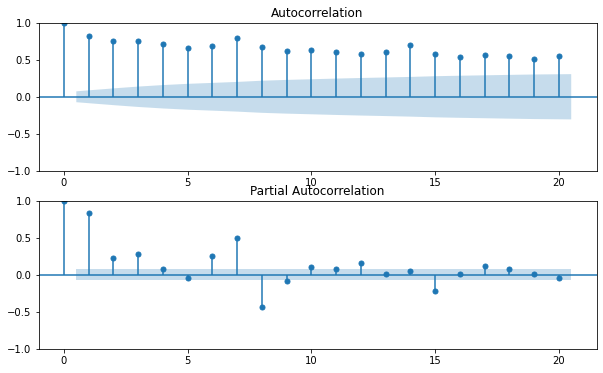

In [62]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6))
plot_acf(USA_train_imputed['new_cases'], lags=20, ax=ax1)
plot_pacf(USA_train_imputed['new_cases'], lags=20, ax=ax2)
plt.show()
# Correlation Bumps at lags of 7 and 14, so we will add lags for those values (Auto arima will do this by itself).

In [63]:
# Adding lags of 7 and 14 to USA train + test
USA_train_imputed['new_cases_Lag_7'] = USA_train_imputed['new_cases'].shift(7)
USA_train_imputed['new_cases_Lag_14'] = USA_train_imputed['new_cases'].shift(14)

USA_test_imputed['new_cases_Lag_7'] = USA_test_imputed['new_cases'].shift(7)
USA_test_imputed['new_cases_Lag_14'] = USA_test_imputed['new_cases'].shift(14)

In [64]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [65]:
# Adding Rolling statistics to USA train (14 day rolling average)
rolling_mean = USA_train_imputed['new_cases'].rolling(window=14).mean()
USA_train_imputed['Rolling_Mean_new_cases'] = rolling_mean
rolling_mean = USA_test_imputed['new_cases'].rolling(window=14).mean()
USA_test_imputed['Rolling_Mean_new_cases'] = rolling_mean

In [66]:
# Add Weekend/Weekday Feature
USA_train_imputed.reset_index(inplace=True)
USA_train_imputed['date'] = pd.to_datetime(USA_train_imputed['date'])
USA_train_imputed['Weekend'] = USA_train_imputed['date'].dt.dayofweek > 4 
USA_train_imputed = USA_train_imputed.set_index('date')

In [67]:
USA_test_imputed.reset_index(inplace=True)
USA_test_imputed['date'] = pd.to_datetime(USA_test_imputed['date'])
USA_test_imputed['Weekend'] = USA_test_imputed['date'].dt.dayofweek > 4 
USA_test_imputed = USA_test_imputed.set_index('date')

In [68]:
# Checking correlation between weekend and response variable, and we can see there is some correlation
pearson_corr = USA_test_imputed['Weekend'].corr(USA_test_imputed['new_cases'], method='pearson')
print(f"Pearson correlation coefficient: {pearson_corr}")

Pearson correlation coefficient: -0.3659847850555484


In [69]:
USA_train_imputed

,iso_code,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,hospital_beds_per_thousand,life_expectancy,stringency_index,total_cases_per_million,human_development_index,total_cases,location,continent,population,new_cases_per_million,new_cases,new_cases_smoothed_per_million,new_cases_smoothed,total_deaths_per_million,new_deaths,total_deaths,new_deaths_per_million,total_tests_per_thousand,new_tests,total_tests,new_tests_per_thousand,reproduction_rate,new_deaths_smoothed,new_deaths_smoothed_per_million,positive_rate,tests_per_case,new_tests_smoothed,new_tests_smoothed_per_thousand,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_hosp_admissions_per_million,weekly_hosp_admissions,total_vaccinations_per_hundred,people_vaccinated,people_fully_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_vaccinations,new_vaccinations,new_vaccinations_smoothed,new_people_vaccinated_smoothed_per_hundred,new_people_vaccinated_smoothed,new_vaccinations_smoothed_per_million,new_cases_Lag_7,new_cases_Lag_14,Rolling_Mean_new_cases,Weekend
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-22,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,0.00,0.003,0.926,1.0,United States,North America,332915074.0,0.000,0.0,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,3.62,0.000,0.000,0.000,0.0,0.0,0.000,9245.0,27.770,33759.0,101.404,91.777,30554.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-01-23,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,0.00,0.003,0.926,1.0,United States,North America,332915074.0,0.000,0.0,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,3.62,0.000,0.000,0.000,0.0,0.0,0.000,9245.0,27.770,33759.0,101.404,91.777,30554.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-01-24,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,0.00,0.006,0.926,2.0,United States,North America,332915074.0,0.003,1.0,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,3.62,0.000,0.000,0.000,0.0,0.0,0.000,9245.0,27.770,33759.0,101.404,91.777,30554.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-01-25,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,0.00,0.006,0.926,2.0,United States,North America,332915074.0,0.000,0.0,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,3.62,0.000,0.000,0.000,0.0,0.0,0.000,9245.0,27.770,33759.0,101.404,91.777,30554.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0,NaN,NaN,NaN,True
2020-01-26,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,0.00,0.015,0.926,5.0,United States,North America,332915074.0,0.009,3.0,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,3.62,0.000,0.000,0.000,0.0,0.0,0.000,9245.0,27.770,33759.0,101.404,91.777,30554.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0,NaN,NaN,NaN,True
2020-01-27,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,0.00,0.015,0.926,5.0,United States,North America,332915074.0,0.000,0.0,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,3.62,0.000,0.000,0.000,0.0,0.0,0.000,9245.0,27.770,33759.0,101.404,91.777,30554.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-01-28,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,0.00,0.015,0.926,5.0,United States,North America,332915074.0,0.000,0.0,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,3.62,0.000,0.000,0.000,0.0,0.0,0.000,9245.0,27.770,33759.0,101.404,91.777,30554.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-01-29,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,0.00,0.018,0.926,6.0,United States,North America,332915074.0,0.003,1.0,0.002,0.714,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,3.62,0.000,0.000,0.000,0.0,0.0,0.000,9245.0,27.770,33759.0,101.404,91.777,30554.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0,0.0,NaN,NaN,False
2020-01-30,USA,35.608,

In [70]:
# Now, Repeat above steps for all other countries
# Adding lags of 7 and 14 to Brazil train + test
Brazil_train_imputed['new_cases_Lag_7'] = Brazil_train_imputed['new_cases'].shift(7)
Brazil_train_imputed['new_cases_Lag_14'] = Brazil_train_imputed['new_cases'].shift(14)

Brazil_test_imputed['new_cases_Lag_7'] = Brazil_test_imputed['new_cases'].shift(7)
Brazil_test_imputed['new_cases_Lag_14'] = Brazil_test_imputed['new_cases'].shift(14)

rolling_mean = Brazil_train_imputed['new_cases'].rolling(window=14).mean()
Brazil_train_imputed['Rolling_Mean_new_cases'] = rolling_mean
rolling_mean = Brazil_test_imputed['new_cases'].rolling(window=14).mean()
Brazil_test_imputed['Rolling_Mean_new_cases'] = rolling_mean

Brazil_train_imputed.reset_index(inplace=True)
Brazil_train_imputed['date'] = pd.to_datetime(Brazil_train_imputed['date'])
Brazil_train_imputed['Weekend'] = Brazil_train_imputed['date'].dt.dayofweek > 4 
Brazil_train_imputed = Brazil_train_imputed.set_index('date')

Brazil_test_imputed.reset_index(inplace=True)
Brazil_test_imputed['date'] = pd.to_datetime(Brazil_test_imputed['date'])
Brazil_test_imputed['Weekend'] = Brazil_test_imputed['date'].dt.dayofweek > 4 
Brazil_test_imputed = Brazil_test_imputed.set_index('date')

Brazil_train_imputed

,iso_code,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,hospital_beds_per_thousand,life_expectancy,human_development_index,population,stringency_index,total_cases_per_million,total_cases,location,continent,new_cases_per_million,new_cases,reproduction_rate,new_deaths_per_million,total_deaths_per_million,new_cases_smoothed_per_million,new_deaths,total_deaths,new_cases_smoothed,new_deaths_smoothed,new_deaths_smoothed_per_million,new_tests_smoothed,new_tests_smoothed_per_thousand,total_tests_per_thousand,total_tests,new_vaccinations_smoothed,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,total_vaccinations,total_vaccinations_per_hundred,new_vaccinations,people_vaccinated,people_vaccinated_per_hundred,new_cases_Lag_7,new_cases_Lag_14,Rolling_Mean_new_cases,Weekend
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-02-26,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,5.56,0.005,1.0,Brazil,South America,0.005,1.0,2.23,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0.0,0.000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,NaN,NaN,NaN,False
2020-02-27,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,5.56,0.005,1.0,Brazil,South America,0.000,0.0,2.23,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0.0,0.000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,NaN,NaN,NaN,False
2020-02-28,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,5.56,0.005,1.0,Brazil,South America,0.000,0.0,2.23,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0.0,0.000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,NaN,NaN,NaN,False
2020-02-29,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,5.56,0.009,2.0,Brazil,South America,0.005,1.0,2.23,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0.0,0.000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,NaN,NaN,NaN,True
2020-03-01,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,5.56,0.009,2.0,Brazil,South America,0.000,0.0,2.23,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0.0,0.000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,NaN,NaN,NaN,True
2020-03-02,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,11.11,0.009,2.0,Brazil,South America,0.000,0.0,2.23,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0.0,0.000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,NaN,NaN,NaN,False
2020-03-03,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,11.11,0.009,2.0,Brazil,South America,0.000,0.0,2.23,0.000,0.000,0.001,0.0,0.0,0.286,0.000,0.000,0.0,0.000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,NaN,NaN,NaN,False
2020-03-04,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,11.11,0.019,4.0,Brazil,South America,0.009,2.0,2.23,0.000,0.000,0.002,0.0,0.0,0.429,0.000,0.000,0.0,0.000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,1.0,NaN,NaN,False
2020-03-05,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,11.11,0.019,4.0,Brazil,South America,0.000,0.0,2.23,0.000,0.000,0.002,0.0,0.0,0.429,0.000,0.000,0.0,0.000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,0.0,NaN,NaN,False


In [71]:
# Adding lags of 7 and 14 to Germany train + test
Germany_train_imputed['new_cases_Lag_7'] = Germany_train_imputed['new_cases'].shift(7)
Germany_train_imputed['new_cases_Lag_14'] = Germany_train_imputed['new_cases'].shift(14)

Germany_test_imputed['new_cases_Lag_7'] = Germany_test_imputed['new_cases'].shift(7)
Germany_test_imputed['new_cases_Lag_14'] = Germany_test_imputed['new_cases'].shift(14)

rolling_mean = Germany_train_imputed['new_cases'].rolling(window=14).mean()
Germany_train_imputed['Rolling_Mean_new_cases'] = rolling_mean
rolling_mean = Germany_test_imputed['new_cases'].rolling(window=14).mean()
Germany_test_imputed['Rolling_Mean_new_cases'] = rolling_mean

Germany_train_imputed.reset_index(inplace=True)
Germany_train_imputed['date'] = pd.to_datetime(Germany_train_imputed['date'])
Germany_train_imputed['Weekend'] = Germany_train_imputed['date'].dt.dayofweek > 4 
Germany_train_imputed = Germany_train_imputed.set_index('date')

Germany_test_imputed.reset_index(inplace=True)
Germany_test_imputed['date'] = pd.to_datetime(Germany_test_imputed['date'])
Germany_test_imputed['Weekend'] = Germany_test_imputed['date'].dt.dayofweek > 4 
Germany_test_imputed = Germany_test_imputed.set_index('date')

Germany_train_imputed

,iso_code,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,cardiovasc_death_rate,hospital_beds_per_thousand,population,life_expectancy,stringency_index,continent,location,total_cases_per_million,human_development_index,total_cases,new_cases_per_million,new_cases,new_cases_smoothed,new_cases_smoothed_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,reproduction_rate,total_deaths,total_deaths_per_million,new_deaths,new_deaths_per_million,icu_patients_per_million,icu_patients,new_tests_smoothed,new_tests_smoothed_per_thousand,new_deaths_smoothed_per_million,new_deaths_smoothed,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,new_people_vaccinated_smoothed_per_hundred,new_vaccinations_smoothed_per_million,new_vaccinations_smoothed,new_vaccinations,new_people_vaccinated_smoothed,total_boosters_per_hundred,total_boosters,new_cases_Lag_7,new_cases_Lag_14,Rolling_Mean_new_cases,Weekend
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-27,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.012,0.947,1.0,0.012,1.0,0.000,0.000,24.0,0.286,2.98,0.0,0.000,0.0,0.000,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-01-28,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.048,0.947,4.0,0.036,3.0,0.000,0.000,24.0,0.286,2.98,0.0,0.000,0.0,0.000,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-01-29,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.048,0.947,4.0,0.000,0.0,0.000,0.000,24.0,0.286,2.98,0.0,0.000,0.0,0.000,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-01-30,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.048,0.947,4.0,0.000,0.0,0.000,0.000,24.0,0.286,2.98,0.0,0.000,0.0,0.000,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-01-31,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.060,0.947,5.0,0.012,1.0,0.000,0.000,24.0,0.286,2.98,0.0,0.000,0.0,0.000,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-02-01,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.095,0.947,8.0,0.036,3.0,0.000,0.000,24.0,0.286,2.98,0.0,0.000,0.0,0.000,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,NaN,NaN,NaN,True
2020-02-02,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.119,0.947,10.0,0.024,2.0,1.429,0.017,24.0,0.286,2.98,0.0,0.000,0.0,0.000,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,NaN,NaN,NaN,True
2020-02-03,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.143,0.947,12.0,0.024,2.0,1.571,0.019,24.0,0.286,2.98,0.0,0.000,0.0,0.000,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,1.0,NaN,NaN,False
2020-02-04,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.143,0.947,12.0,0.000,0.0,1.143,0.014,24.0,0.286,2.98,0.0,0.000,0.0,0.000,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,3.0,NaN,NaN,False


In [72]:
# Adding lags of 7 and 14 to Nigeria train + test
Nigeria_train_imputed['new_cases_Lag_7'] = Nigeria_train_imputed['new_cases'].shift(7)
Nigeria_train_imputed['new_cases_Lag_14'] = Nigeria_train_imputed['new_cases'].shift(14)

Nigeria_test_imputed['new_cases_Lag_7'] = Nigeria_test_imputed['new_cases'].shift(7)
Nigeria_test_imputed['new_cases_Lag_14'] = Nigeria_test_imputed['new_cases'].shift(14)

rolling_mean = Nigeria_train_imputed['new_cases'].rolling(window=14).mean()
Nigeria_train_imputed['Rolling_Mean_new_cases'] = rolling_mean
rolling_mean = Nigeria_test_imputed['new_cases'].rolling(window=14).mean()
Nigeria_test_imputed['Rolling_Mean_new_cases'] = rolling_mean

Nigeria_train_imputed.reset_index(inplace=True)
Nigeria_train_imputed['date'] = pd.to_datetime(Nigeria_train_imputed['date'])
Nigeria_train_imputed['Weekend'] = Nigeria_train_imputed['date'].dt.dayofweek > 4 
Nigeria_train_imputed = Nigeria_train_imputed.set_index('date')

Nigeria_test_imputed.reset_index(inplace=True)
Nigeria_test_imputed['date'] = pd.to_datetime(Nigeria_test_imputed['date'])
Nigeria_test_imputed['Weekend'] = Nigeria_test_imputed['date'].dt.dayofweek > 4 
Nigeria_test_imputed = Nigeria_test_imputed.set_index('date')

Nigeria_train_imputed

,iso_code,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,cardiovasc_death_rate,handwashing_facilities,life_expectancy,human_development_index,population,stringency_index,new_cases_per_million,total_cases_per_million,new_cases,total_cases,location,continent,new_cases_smoothed_per_million,new_cases_smoothed,total_deaths_per_million,total_deaths,new_deaths,new_deaths_per_million,reproduction_rate,new_deaths_smoothed,new_deaths_smoothed_per_million,tests_per_case,positive_rate,new_tests_smoothed,new_tests_smoothed_per_thousand,new_vaccinations_smoothed,new_people_vaccinated_smoothed_per_hundred,new_people_vaccinated_smoothed,new_vaccinations_smoothed_per_million,new_cases_Lag_7,new_cases_Lag_14,Rolling_Mean_new_cases,Weekend
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-02-28,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.005,0.005,1.0,1.0,Nigeria,Africa,0.000,0.000,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-02-29,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.000,0.005,0.0,1.0,Nigeria,Africa,0.000,0.000,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,NaN,NaN,NaN,True
2020-03-01,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.000,0.005,0.0,1.0,Nigeria,Africa,0.000,0.000,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,NaN,NaN,NaN,True
2020-03-02,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.000,0.005,0.0,1.0,Nigeria,Africa,0.000,0.000,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-03-03,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.000,0.005,0.0,1.0,Nigeria,Africa,0.000,0.000,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-03-04,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.000,0.005,0.0,1.0,Nigeria,Africa,0.000,0.000,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-03-05,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.000,0.005,0.0,1.0,Nigeria,Africa,0.001,0.143,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-03-06,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.000,0.005,0.0,1.0,Nigeria,Africa,0.000,0.000,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,1.0,NaN,NaN,False
2020-03-07,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.000,0.005,0.0,1.0,Nigeria,Africa,0.000,0.000,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,0.0,NaN,NaN,True


In [73]:
# Adding lags of 7 and 14 to China train + test
China_train_imputed['new_cases_Lag_7'] = China_train_imputed['new_cases'].shift(7)
China_train_imputed['new_cases_Lag_14'] = China_train_imputed['new_cases'].shift(14)

China_test_imputed['new_cases_Lag_7'] = China_test_imputed['new_cases'].shift(7)
China_test_imputed['new_cases_Lag_14'] = China_test_imputed['new_cases'].shift(14)

rolling_mean = China_train_imputed['new_cases'].rolling(window=14).mean()
China_train_imputed['Rolling_Mean_new_cases'] = rolling_mean
rolling_mean = China_test_imputed['new_cases'].rolling(window=14).mean()
China_test_imputed['Rolling_Mean_new_cases'] = rolling_mean

China_train_imputed.reset_index(inplace=True)
China_train_imputed['date'] = pd.to_datetime(China_train_imputed['date'])
China_train_imputed['Weekend'] = China_train_imputed['date'].dt.dayofweek > 4 
China_train_imputed = China_train_imputed.set_index('date')

China_test_imputed.reset_index(inplace=True)
China_test_imputed['date'] = pd.to_datetime(China_test_imputed['date'])
China_test_imputed['Weekend'] = China_test_imputed['date'].dt.dayofweek > 4 
China_test_imputed = China_test_imputed.set_index('date')

China_train_imputed

,iso_code,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,life_expectancy,human_development_index,hospital_beds_per_thousand,continent,total_deaths_per_million,location,total_cases_per_million,total_deaths,total_cases,reproduction_rate,new_deaths_per_million,new_deaths,new_cases_per_million,new_cases,new_deaths_smoothed_per_million,new_deaths_smoothed,new_cases_smoothed,new_cases_smoothed_per_million,new_vaccinations_smoothed,new_vaccinations_smoothed_per_million,total_vaccinations,total_vaccinations_per_hundred,new_vaccinations,new_cases_Lag_7,new_cases_Lag_14,Rolling_Mean_new_cases,Weekend
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-22,CHN,26.39,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.012,China,0.379,17.0,547.0,3.04,0.000,0.0,0.000,0.0,0.000,0.000,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0,NaN,NaN,NaN,False
2020-01-23,CHN,44.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.012,China,0.442,18.0,639.0,3.04,0.001,1.0,0.064,92.0,0.000,0.000,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0,NaN,NaN,NaN,False
2020-01-24,CHN,44.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.018,China,0.634,26.0,916.0,3.24,0.006,8.0,0.192,277.0,0.000,0.000,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0,NaN,NaN,NaN,False
2020-01-25,CHN,47.69,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.029,China,0.969,42.0,1399.0,3.41,0.011,16.0,0.334,483.0,0.000,0.000,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0,NaN,NaN,NaN,True
2020-01-26,CHN,69.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.039,China,1.428,56.0,2062.0,3.49,0.010,14.0,0.459,663.0,0.000,0.000,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0,NaN,NaN,NaN,True
2020-01-27,CHN,69.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.057,China,1.982,82.0,2863.0,3.54,0.018,26.0,0.555,801.0,0.000,0.000,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0,NaN,NaN,NaN,False
2020-01-28,CHN,69.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.091,China,3.804,131.0,5494.0,3.55,0.034,49.0,1.822,2631.0,0.000,0.000,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0,NaN,NaN,NaN,False
2020-01-29,CHN,69.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.092,China,4.203,133.0,6070.0,3.21,0.001,2.0,0.399,576.0,0.011,16.571,789.000,0.546,0.0,0.0,0.000000e+00,0.00,0.0,0.0,NaN,NaN,False
2020-01-30,CHN,69.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.118,China,5.625,171.0,8124.0,3.00,0.026,38.0,1.422,2054.0,0.015,21.857,1069.286,0.740,0.0,0.0,0.000000e+00,0.00,0.0,92.0,NaN,NaN,False


In [74]:
# Adding lags of 7 and 14 to Australia train + test
Australia_train_imputed['new_cases_Lag_7'] = Australia_train_imputed['new_cases'].shift(7)
Australia_train_imputed['new_cases_Lag_14'] = Australia_train_imputed['new_cases'].shift(14)

Australia_test_imputed['new_cases_Lag_7'] = Australia_test_imputed['new_cases'].shift(7)
Australia_test_imputed['new_cases_Lag_14'] = Australia_test_imputed['new_cases'].shift(14)

rolling_mean = Australia_train_imputed['new_cases'].rolling(window=14).mean()
Australia_train_imputed['Rolling_Mean_new_cases'] = rolling_mean
rolling_mean = Australia_test_imputed['new_cases'].rolling(window=14).mean()
Australia_test_imputed['Rolling_Mean_new_cases'] = rolling_mean

Australia_train_imputed.reset_index(inplace=True)
Australia_train_imputed['date'] = pd.to_datetime(Australia_train_imputed['date'])
Australia_train_imputed['Weekend'] = Australia_train_imputed['date'].dt.dayofweek > 4 
Australia_train_imputed = Australia_train_imputed.set_index('date')

Australia_test_imputed.reset_index(inplace=True)
Australia_test_imputed['date'] = pd.to_datetime(Australia_test_imputed['date'])
Australia_test_imputed['Weekend'] = Australia_test_imputed['date'].dt.dayofweek > 4 
Australia_test_imputed = Australia_test_imputed.set_index('date')

Australia_train_imputed

,iso_code,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,hospital_beds_per_thousand,life_expectancy,stringency_index,new_cases_per_million,total_cases_per_million,human_development_index,new_cases,total_cases,location,continent,population,new_cases_smoothed_per_million,new_cases_smoothed,total_deaths_per_million,total_deaths,new_deaths,new_deaths_per_million,total_tests_per_thousand,total_tests,new_tests,new_tests_per_thousand,reproduction_rate,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,new_deaths_smoothed_per_million,new_deaths_smoothed,icu_patients_per_million,hosp_patients,hosp_patients_per_million,icu_patients,new_vaccinations_smoothed,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,total_vaccinations_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,new_vaccinations,new_cases_Lag_7,new_cases_Lag_14,Rolling_Mean_new_cases,Weekend
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-26,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,5.56,0.155,0.155,0.944,4.0,4.0,Australia,Oceania,25788217.0,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,True
2020-01-27,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,5.56,0.039,0.194,0.944,1.0,5.0,Australia,Oceania,25788217.0,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-01-28,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,5.56,0.000,0.194,0.944,0.0,5.0,Australia,Oceania,25788217.0,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-01-29,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,5.56,0.039,0.233,0.944,1.0,6.0,Australia,Oceania,25788217.0,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-01-30,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,5.56,0.116,0.349,0.944,3.0,9.0,Australia,Oceania,25788217.0,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-01-31,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,5.56,0.000,0.349,0.944,0.0,9.0,Australia,Oceania,25788217.0,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-02-01,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,13.89,0.116,0.465,0.944,3.0,12.0,Australia,Oceania,25788217.0,0.066,1.714,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,True
2020-02-02,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,13.89,0.000,0.465,0.944,0.0,12.0,Australia,Oceania,25788217.0,0.044,1.143,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,4.0,NaN,NaN,True
2020-02-03,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,19.44,0.000,0.465,0.944,0.0,12.0,Australia,Oceania,25788217.0,0.039,1.000,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,1.0,NaN,NaN,False


## ARIMA MODEL - UNIVARIATE

### USA

<AxesSubplot:xlabel='date'>

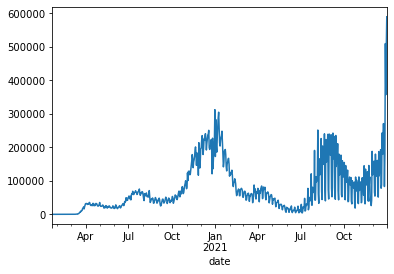

In [377]:
USA_train_imputed['new_cases'].plot()

In [378]:
import warnings
warnings.filterwarnings("ignore")
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

USA_train_target = USA_train_imputed['new_cases']
USA_test_target = USA_test_imputed['new_cases']

In [188]:
def evaluate_arima_model(train, test, arima_order):
    history = [x for x in train]
    # make predictions
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])
   
    error = np.sqrt(mean_squared_error(test, predictions))
    return error

def evaluate_models(train, test, p_values, d_values, q_values):
    best_score, best_cfg = float("inf"), None
    print(best_score)
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                print(order)
                mse = evaluate_arima_model(train, test, order)
                if mse < best_score:
                    best_score, best_cfg = mse, order
    print('Best ARIMA%s MSE=%.3f' % (best_cfg, best_score))


In [379]:
split_index = int(len(USA_train_target) * 0.8)
USA_train_train_target = USA_train_target[:split_index]
USA_train_test_target = USA_train_target[split_index:]

In [380]:
# tune using train error
p_values = [7]
d_values = [1]
q_values = [1, 2]


warnings.filterwarnings("ignore")
evaluate_models(USA_train_train_target, USA_train_test_target, p_values, d_values, q_values)
# Best was 7,1,1

inf
(7, 1, 1)


KeyboardInterrupt: 

In [381]:
# Percentage Error on train dataset
history = [x for x in USA_train_train_target]
USA_train_predictions = list()
for t in range(len(USA_train_test_target)):
    model = ARIMA(history, order=(7,1,1))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    USA_train_predictions.append(yhat)
    obs = USA_train_test_target[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))

predicted=153202.272282, expected=144946.000030
predicted=244963.263050, expected=225945.000030
predicted=93094.313363, expected=68246.000030
predicted=63773.081688, expected=44034.000030
predicted=165418.116329, expected=203798.000030
predicted=127657.853224, expected=148805.000030
predicted=160914.967162, expected=166566.000030
predicted=174123.568173, expected=154374.000030
predicted=214283.987794, expected=240003.000030
predicted=99953.923716, expected=82491.000030
predicted=74767.192387, expected=40147.000030
predicted=202122.684088, expected=223018.000030
predicted=153355.128544, expected=155064.000030
predicted=159909.543503, expected=172418.000030
predicted=172958.369885, expected=187653.000030
predicted=234052.309030, expected=238453.000030
predicted=105779.128106, expected=72876.000030
predicted=62478.760170, expected=45606.000030
predicted=218627.571061, expected=239513.000030
predicted=155925.241858, expected=180246.000030
predicted=171751.213538, expected=196631.000030
pre

<AxesSubplot:xlabel='date'>

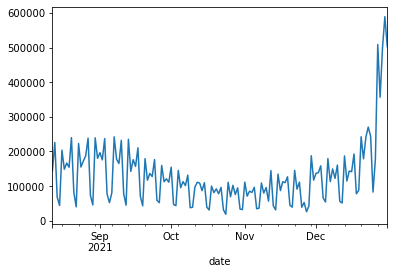

In [382]:
USA_train_test_target.plot()

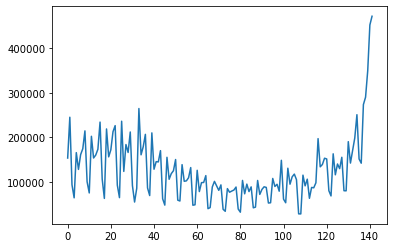

In [385]:
plt.plot(USA_train_predictions)
plt.show()

In [359]:
# Test Predictions
history = [x for x in USA_train_target]
USA_predictions = list()
for t in range(len(USA_test_target)):
    model = ARIMA(history, order=(7,1,1))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    USA_predictions.append(yhat)
    obs = USA_test_target[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
    
# evaluate forecasts
rmse = np.sqrt(mean_squared_error(USA_test_target, USA_predictions))

predicted=355354.444508, expected=181222.000000
predicted=368484.448547, expected=278055.000000
predicted=592324.418562, expected=1076185.000000
predicted=688371.533338, expected=805837.000000
predicted=755077.051090, expected=644999.000000
predicted=804885.724314, expected=815087.000000
predicted=773265.762356, expected=856368.000000
predicted=540046.503666, expected=386226.000000
predicted=552385.143568, expected=475999.000000
predicted=1294633.145210, expected=1368167.000000
predicted=1146951.210381, expected=769464.000000
predicted=692093.660788, expected=909481.000000
predicted=1014438.339109, expected=840605.000000
predicted=1003241.518459, expected=859527.000000
predicted=510592.226000, expected=394386.000000
predicted=598149.210624, expected=468334.000000
predicted=1394064.179151, expected=661635.000000
predicted=548846.358453, expected=1113192.000000
predicted=890279.819183, expected=998645.000000
predicted=908116.014442, expected=711021.000000
predicted=750001.415115, expecte

In [360]:
rmse

185252.62671559548

In [197]:
(np.abs(USA_test_target-USA_predictions)/USA_test_target).mean()

0.3081151696021067

<AxesSubplot:xlabel='date'>

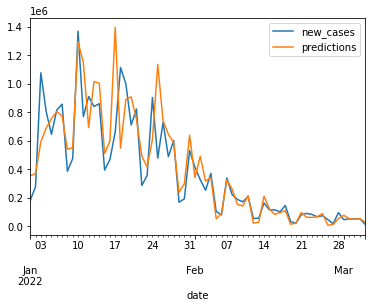

In [185]:
USA_test_imputed['predictions'] = USA_predictions
USA_test_imputed.plot(y=["new_cases", "predictions"])

### BRAZIL

In [191]:
Brazil_train_target = Brazil_train_imputed['new_cases']
Brazil_test_target = Brazil_test_imputed['new_cases']
split_index = int(len(Brazil_train_target) * 0.8)
Brazil_train_train_target = Brazil_train_target[:split_index]
Brazil_train_test_target = Brazil_train_target[split_index:]

p_values = [7]
d_values = [1]
q_values = [1, 2]


warnings.filterwarnings("ignore")
evaluate_models(Brazil_train_train_target, Brazil_train_test_target, p_values, d_values, q_values)
# Best was 7,1,1

inf
(7, 1, 1)
(7, 1, 2)
Best ARIMA(7, 1, 1) MSE=4399.237


In [199]:
history = [x for x in Brazil_train_train_target]
Brazil_train_predictions = list()
for t in range(len(Brazil_train_test_target)):
    model = ARIMA(history, order=(7,1,1))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    Brazil_train_predictions.append(yhat)
    obs = Brazil_train_test_target[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
    
(np.abs(Brazil_train_test_target-Brazil_train_predictions)/Brazil_train_test_target).mean()

predicted=36264.100381, expected=36013.000000
predicted=33794.455728, expected=34213.000000
predicted=28826.038301, expected=25322.000000
predicted=15888.689367, expected=13945.000000
predicted=19957.064754, expected=15654.000000
predicted=33447.281396, expected=31809.000000
predicted=36944.082893, expected=29979.000000
predicted=31582.769672, expected=30923.000000
predicted=30782.970355, expected=27756.000000
predicted=22777.755417, expected=22947.000000
predicted=14639.042281, expected=11263.000000
predicted=16098.063612, expected=12801.000000
predicted=26204.314337, expected=26846.000000
predicted=29199.313194, expected=25748.000000
predicted=27282.528180, expected=27023.000000
predicted=26248.305037, expected=23604.000000
predicted=20339.557124, expected=20325.000000
predicted=12345.966608, expected=12661.000000
predicted=14790.769465, expected=10172.000000
predicted=21886.032371, expected=13604.000000
predicted=21223.903245, expected=14182.000000
predicted=20460.190683, expected=3

0.27292965670475094

<AxesSubplot:xlabel='date'>

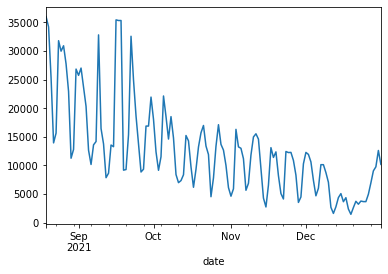

In [386]:
Brazil_train_test_target.plot()

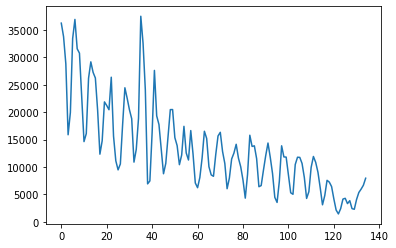

In [387]:
plt.plot(Brazil_train_predictions)
plt.show()

In [200]:
history = [x for x in Brazil_train_target]
Brazil_predictions = list()
for t in range(len(Brazil_test_target)):
    model = ARIMA(history, order=(7,1,1))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    Brazil_predictions.append(yhat)
    obs = Brazil_test_target[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
    
# evaluate forecasts
rmse = np.sqrt(mean_squared_error(Brazil_test_target, Brazil_predictions))

predicted=7031.968401, expected=3782.000000
predicted=5319.876531, expected=1806.000000
predicted=6047.407783, expected=11654.000000
predicted=11005.193913, expected=19171.000000
predicted=14398.844787, expected=22852.000000
predicted=17385.973540, expected=35826.000000
predicted=21167.303834, expected=63292.000000
predicted=30366.428583, expected=49303.000000
predicted=25750.572881, expected=29658.000000
predicted=26282.151230, expected=33921.000000
predicted=33229.699105, expected=73255.000000
predicted=53205.007982, expected=87873.000000
predicted=73011.241435, expected=97945.000000
predicted=92873.161245, expected=111112.000000
predicted=86549.026691, expected=48562.000000
predicted=38303.077985, expected=33277.000000
predicted=46080.253500, expected=74381.000000
predicted=91770.600901, expected=140342.000000
predicted=124672.033236, expected=195541.000000
predicted=165810.122856, expected=169786.000000
predicted=143626.587630, expected=171321.000000
predicted=114257.098699, expect

In [201]:
rmse

31506.663160521468

In [202]:
(np.abs(Brazil_test_target-Brazil_predictions)/Brazil_test_target).mean()

0.342490858397336

<AxesSubplot:xlabel='date'>

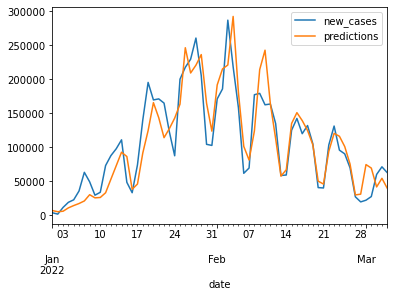

In [203]:
Brazil_test_imputed['predictions'] = Brazil_predictions
Brazil_test_imputed.plot(y=["new_cases", "predictions"])

### GERMANY

In [195]:
Germany_train_target = Germany_train_imputed['new_cases']
Germany_test_target = Germany_test_imputed['new_cases']
split_index = int(len(Germany_train_target) * 0.8)
Germany_train_train_target = Germany_train_target[:split_index]
Germany_train_test_target = Germany_train_target[split_index:]

p_values = [7]
d_values = [1]
q_values = [1, 2]


warnings.filterwarnings("ignore")
evaluate_models(Germany_train_train_target, Germany_train_test_target, p_values, d_values, q_values)
# Best was 7,1,1

inf
(7, 1, 1)
(7, 1, 2)
Best ARIMA(7, 1, 1) MSE=12130.393


In [204]:
history = [x for x in Germany_train_train_target]
Germany_train_predictions = list()
for t in range(len(Germany_train_test_target)):
    model = ARIMA(history, order=(7,1,1))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    Germany_train_predictions.append(yhat)
    obs = Germany_train_test_target[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
    
(np.abs(Germany_train_test_target-Germany_train_predictions)/Germany_train_test_target).mean()

predicted=4044.129851, expected=5536.000000
predicted=3605.629423, expected=4675.000000
predicted=3155.649283, expected=3732.000000
predicted=3372.015400, expected=3549.000000
predicted=4405.418510, expected=5391.000000
predicted=5800.960893, expected=9008.000000
predicted=6766.801966, expected=8303.000000
predicted=6614.295961, expected=8966.000000
predicted=5996.462215, expected=6600.000000
predicted=4975.357502, expected=5946.000000
predicted=5461.993107, expected=5592.000000
predicted=7154.586558, expected=16654.000000
predicted=11262.326924, expected=13275.000000
predicted=11152.044291, expected=11688.000000
predicted=10188.188354, expected=1940.000000
predicted=5747.229504, expected=8395.000000
predicted=6960.668076, expected=6627.000000
predicted=10172.863287, expected=6823.000000
predicted=14162.895657, expected=18646.000000
predicted=13727.148182, expected=14158.000000
predicted=10364.538951, expected=13950.000000
predicted=7745.260858, expected=2899.000000
predicted=6981.5022

0.4169077043956731

<AxesSubplot:xlabel='date'>

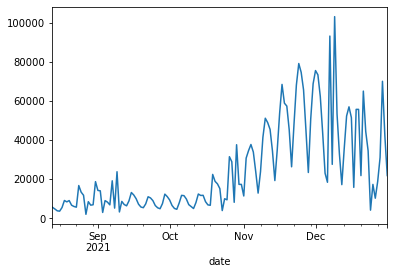

In [388]:
Germany_train_test_target.plot()

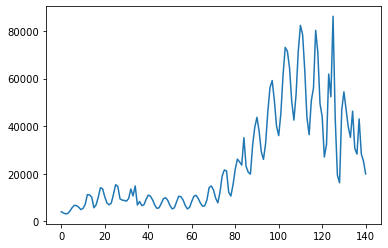

In [389]:
plt.plot(Germany_train_predictions)

In [205]:
history = [x for x in Germany_train_target]
Germany_predictions = list()
for t in range(len(Germany_test_target)):
    model = ARIMA(history, order=(7,1,1))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    Germany_predictions.append(yhat)
    obs = Germany_test_target[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
    
# evaluate forecasts
rmse = np.sqrt(mean_squared_error(Germany_test_target, Germany_predictions))

predicted=14683.587747, expected=2968.000000
predicted=5714.118673, expected=12636.000000
predicted=16456.107237, expected=50013.000000
predicted=45522.185846, expected=61905.000000
predicted=63363.063682, expected=67337.000000
predicted=42540.514569, expected=59110.000000
predicted=25481.053610, expected=52621.000000
predicted=21306.595163, expected=32128.000000
predicted=34804.672969, expected=21839.000000
predicted=49331.547117, expected=16618.000000
predicted=50865.656072, expected=120271.000000
predicted=73671.077537, expected=86232.000000
predicted=80340.149227, expected=89920.000000
predicted=58755.338411, expected=77175.000000
predicted=42411.657911, expected=44251.000000
predicted=33950.685252, expected=33129.000000
predicted=55789.737385, expected=82818.000000
predicted=106167.038795, expected=118105.000000
predicted=108000.007201, expected=139000.000000
predicted=115863.820923, expected=140870.000000
predicted=99429.499886, expected=133329.000000
predicted=82474.531296, expe

In [206]:
rmse

65069.642440343065

In [207]:
(np.abs(Germany_test_target-Germany_predictions)/Germany_test_target).mean()

0.4570252038292774

<AxesSubplot:xlabel='date'>

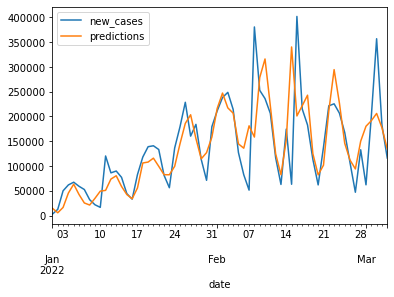

In [208]:
Germany_test_imputed['predictions'] = Germany_predictions
Germany_test_imputed.plot(y=["new_cases", "predictions"])

### NIGERIA

In [209]:
Nigeria_train_target = Nigeria_train_imputed['new_cases']
Nigeria_test_target = Nigeria_test_imputed['new_cases']
split_index = int(len(Nigeria_train_target) * 0.9)
Nigeria_train_train_target = Nigeria_train_target[:split_index]
Nigeria_train_test_target = Nigeria_train_target[split_index:]

p_values = [7]
d_values = [1]
q_values = [1, 2]


warnings.filterwarnings("ignore")
evaluate_models(Nigeria_train_train_target, Nigeria_train_test_target, p_values, d_values, q_values)
# Best was 7,1,1

inf
(7, 1, 1)
(7, 1, 2)
Best ARIMA(7, 1, 2) MSE=901.584


In [220]:
history = [x for x in Nigeria_train_train_target]
Nigeria_train_predictions = list()
for t in range(len(Nigeria_train_test_target)):
    model = ARIMA(history, order=(7,1,2))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    Nigeria_train_predictions.append(yhat)
    obs = Nigeria_train_test_target[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
    
Nigeria_train_test_target += 0.000001    
(np.abs(Nigeria_train_test_target-Nigeria_train_predictions)/Nigeria_train_predictions).mean()

predicted=130.236659, expected=711.000001
predicted=211.035061, expected=159.000001
predicted=225.511249, expected=166.000001
predicted=305.182272, expected=182.000001
predicted=220.159337, expected=120.000001
predicted=165.567578, expected=89.000001
predicted=271.556791, expected=74.000001
predicted=307.880681, expected=90.000001
predicted=159.985115, expected=99.000001
predicted=117.066787, expected=209.000001
predicted=113.716025, expected=87.000001
predicted=84.882266, expected=65.000001
predicted=77.091682, expected=116.000001
predicted=62.702029, expected=86.000001
predicted=58.694862, expected=52.000001
predicted=90.177134, expected=64.000001
predicted=98.619498, expected=65.000001
predicted=58.498248, expected=53.000001
predicted=52.881266, expected=129.000001
predicted=69.666778, expected=51.000001
predicted=53.549032, expected=20.000001
predicted=48.557762, expected=30.000001
predicted=38.789771, expected=0.000001
predicted=23.076316, expected=226.000001
predicted=62.635194, 

1.1097942734918718

<AxesSubplot:xlabel='date'>

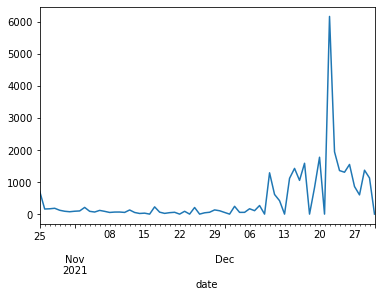

In [391]:
Nigeria_train_test_target.plot()

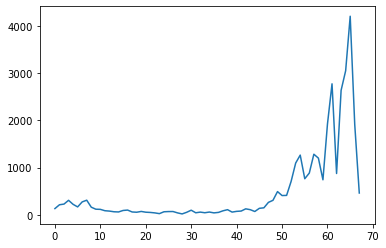

In [392]:
plt.plot(Nigeria_train_predictions)

In [212]:
history = [x for x in Nigeria_train_target]
Nigeria_predictions = list()
for t in range(len(Nigeria_test_target)):
    model = ARIMA(history, order=(7,1,2))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    Nigeria_predictions.append(yhat)
    obs = Nigeria_test_target[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
    
# evaluate forecasts
rmse = np.sqrt(mean_squared_error(Nigeria_test_target, Nigeria_predictions))

predicted=432.127127, expected=1364.000000
predicted=1206.536203, expected=0.000000
predicted=1315.945460, expected=1243.000000
predicted=738.386203, expected=428.000000
predicted=303.766263, expected=856.000000
predicted=748.957042, expected=791.000000
predicted=833.160297, expected=814.000000
predicted=870.369561, expected=766.000000
predicted=645.489217, expected=537.000000
predicted=664.782768, expected=420.000000
predicted=715.794523, expected=422.000000
predicted=666.073202, expected=432.000000
predicted=567.075749, expected=423.000000
predicted=503.829657, expected=0.000000
predicted=435.822517, expected=619.000000
predicted=343.069566, expected=301.000000
predicted=334.513321, expected=249.000000
predicted=398.011004, expected=163.000000
predicted=304.956225, expected=230.000000
predicted=251.660483, expected=0.000000
predicted=179.363492, expected=359.000000
predicted=226.395348, expected=29.000000
predicted=273.450177, expected=228.000000
predicted=197.232289, expected=241.00

In [213]:
rmse

237.46960261679388

In [221]:
Nigeria_test_target += 0.00001
(np.abs(Nigeria_test_target-Nigeria_predictions)/Nigeria_predictions).mean()

0.6184283974440485

<AxesSubplot:xlabel='date'>

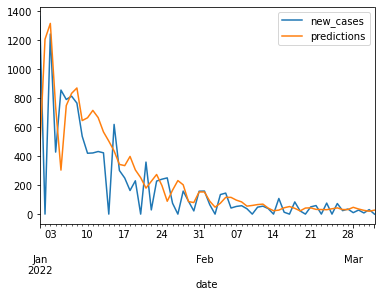

In [218]:
Nigeria_test_imputed['predictions'] = Nigeria_predictions
Nigeria_test_imputed.plot(y=["new_cases", "predictions"])

### CHINA

In [219]:
China_train_target = China_train_imputed['new_cases']
China_test_target = China_test_imputed['new_cases']
split_index = int(len(China_train_target) * 0.9)
China_train_train_target = China_train_target[:split_index]
China_train_test_target = China_train_target[split_index:]

p_values = [7]
d_values = [1]
q_values = [1, 2]


warnings.filterwarnings("ignore")
evaluate_models(China_train_train_target, China_train_test_target, p_values, d_values, q_values)
# Best was 7,1,1

inf
(7, 1, 1)
(7, 1, 2)
Best ARIMA(7, 1, 2) MSE=37.726


In [222]:
history = [x for x in China_train_train_target]
China_train_predictions = list()
for t in range(len(China_train_test_target)):
    model = ARIMA(history, order=(7,1,2))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    China_train_predictions.append(yhat)
    obs = China_train_test_target[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
    
China_train_test_target += 0.00000001
(np.abs(China_train_test_target-China_train_predictions)/China_train_predictions).mean()

predicted=24.202269, expected=45.000000
predicted=25.679953, expected=44.000000
predicted=32.042226, expected=38.000000
predicted=34.971031, expected=63.000000
predicted=48.760918, expected=39.000000
predicted=43.710454, expected=39.000000
predicted=48.892836, expected=64.000000
predicted=58.707500, expected=78.000000
predicted=65.943505, expected=72.000000
predicted=66.946870, expected=91.000000
predicted=78.298744, expected=71.000000
predicted=74.061674, expected=110.000000
predicted=88.600107, expected=103.000000
predicted=85.839567, expected=78.000000
predicted=81.974385, expected=60.000000
predicted=76.106625, expected=69.000000
predicted=77.921044, expected=89.000000
predicted=80.143821, expected=62.000000
predicted=70.984093, expected=54.000000
predicted=71.014732, expected=64.000000
predicted=73.531490, expected=96.000000
predicted=82.243969, expected=75.000000
predicted=74.171374, expected=89.000000
predicted=82.453152, expected=52.000000
predicted=69.808454, expected=22.00000

0.3762324120424787

<AxesSubplot:xlabel='date'>

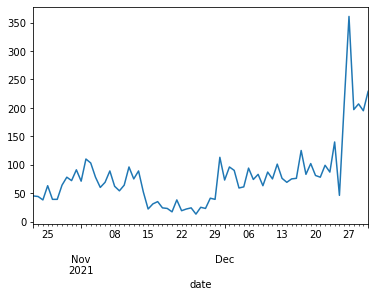

In [393]:
China_train_test_target.plot()

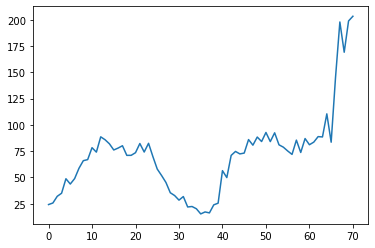

In [395]:
plt.plot(China_train_predictions)

In [225]:
history = [x for x in China_train_target]
China_predictions = list()
for t in range(len(China_test_target)):
    model = ARIMA(history, order=(7,1,1))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    China_predictions.append(yhat)
    obs = China_test_target[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
    
# evaluate forecasts
China_predictions = [max(0, x) for x in China_predictions]
rmse = np.sqrt(mean_squared_error(China_test_target, China_predictions))

predicted=205.628047, expected=191.000000
predicted=179.710547, expected=161.000000
predicted=186.288570, expected=175.000000
predicted=199.565706, expected=91.000000
predicted=158.628664, expected=189.000000
predicted=182.712804, expected=174.000000
predicted=167.912501, expected=159.000000
predicted=169.463546, expected=165.000000
predicted=168.840706, expected=157.000000
predicted=166.680138, expected=192.000000
predicted=174.353166, expected=221.000000
predicted=180.752005, expected=190.000000
predicted=180.824135, expected=201.000000
predicted=191.368348, expected=165.000000
predicted=179.643806, expected=119.000000
predicted=161.600566, expected=223.000000
predicted=190.098367, expected=171.000000
predicted=170.754293, expected=87.000000
predicted=148.174074, expected=66.000000
predicted=133.792802, expected=73.000000
predicted=123.605460, expected=63.000000
predicted=99.530403, expected=58.000000
predicted=86.123573, expected=55.000000
predicted=86.039708, expected=45.000000
pre

In [226]:
rmse

41.34516039470729

In [227]:
(np.abs(China_test_target-China_predictions)/China_predictions).mean()

0.2714599212384066

<AxesSubplot:xlabel='date'>

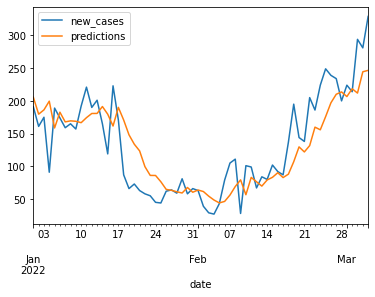

In [228]:
China_test_imputed['predictions'] = China_predictions
China_test_imputed.plot(y=["new_cases", "predictions"])

### AUSTRALIA

In [94]:
Australia_train_target = Australia_train_imputed['new_cases']
Australia_test_target = Australia_test_imputed['new_cases']
history = [x for x in Australia_train_target]
Australia_predictions = list()
for t in range(len(Australia_test_target)):
    model = ARIMA(history, order=(7,1,2))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    Australia_predictions.append(yhat)
    obs = Australia_test_target[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
    
# evaluate forecasts
Australia_predictions = [max(0, x) for x in Australia_predictions]
rmse = np.sqrt(mean_squared_error(Australia_test_target, Australia_predictions))

predicted=42021.318553, expected=37459.000000
predicted=31166.438712, expected=29608.000000
predicted=32608.515340, expected=44745.000000
predicted=-0.001176, expected=71495.000000


LinAlgError: LU decomposition error.

In [ ]:
rmse

In [ ]:
Australia_test_imputed['predictions'] = Australia_predictions
Australia_test_imputed.plot(y=["new_cases", "predictions"])

In [ ]:
Australia_train_imputed

## AUTO ARIMA MODEL - UNIVARIATE

### USA

In [229]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
 
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss

<AxesSubplot:xlabel='date'>

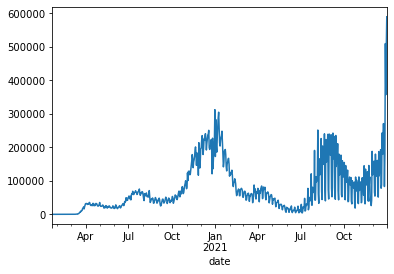

In [233]:
USA_train_target.plot()

In [230]:
result=adfuller(USA_train_target)
print('Test Statistic: %f' %result[0])
print('p-value: %f' %result[1])
print('Critical values:')
for key, value in result[4].items ():
     print('\t%s: %.3f' %(key, value))


Test Statistic: 0.353508
p-value: 0.979671
Critical values:
	1%: -3.440
	5%: -2.866
	10%: -2.569


In [231]:
df_log=np.log(USA_train_target)
pseudocount = 1e-5
df_log += pseudocount
df_diff=df_log.diff().dropna()

<AxesSubplot:xlabel='date'>

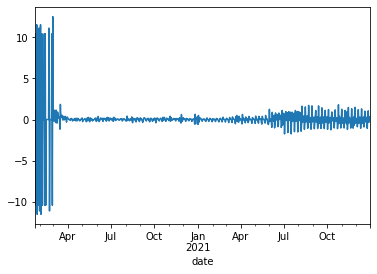

In [234]:
df_diff.plot()

In [232]:
result=adfuller(df_diff)
print('Test Statistic: %f' %result[0])
print('p-value: %f' %result[1])
print('Critical values:')
for key, value in result[4].items ():
     print('\t%s: %.3f' %(key, value))


Test Statistic: -4.335260
p-value: 0.000386
Critical values:
	1%: -3.440
	5%: -2.866
	10%: -2.569


In [235]:
df_diff

date
2020-01-23     0.000000
2020-01-24    10.414343
2020-01-25   -10.414343
2020-01-26    11.512935
2020-01-27   -11.512935
2020-01-28     0.000000
2020-01-29    10.414343
2020-01-30   -10.414343
2020-01-31    11.107475
2020-02-01   -11.107475
2020-02-02     0.000000
2020-02-03    11.512935
2020-02-04   -11.512935
2020-02-05     0.000000
2020-02-06    10.414343
2020-02-07   -10.414343
2020-02-08     0.000000
2020-02-09     0.000000
2020-02-10     0.000000
2020-02-11    10.414343
2020-02-12   -10.414343
2020-02-13    10.414343
2020-02-14   -10.414343
2020-02-15     0.000000
2020-02-16     0.000000
2020-02-17     0.000000
2020-02-18     0.000000
2020-02-19     0.000000
2020-02-20     0.000000
2020-02-21    11.107475
2020-02-22   -11.107475
2020-02-23     0.000000
2020-02-24     0.000000
2020-02-25     0.000000
2020-02-26     0.000000
2020-02-27    10.414343
2020-02-28   -10.414343
2020-02-29    12.493758
2020-03-01    -0.133531
2020-03-02     1.189581
2020-03-03    -0.191055
2020-03-04 

In [350]:
from pmdarima.arima import auto_arima

USA_auto_arima_model = auto_arima(USA_train_target, start_p=1, start_q=1,
                      test='adf',
                      max_p=7, max_q=7,
                      m=1,                       
                      seasonal=True,   
                      start_P=1, d=1, D=0,  
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=16881.345, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=17095.960, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=16997.151, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=16880.961, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=17094.167, Time=0.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=16880.193, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=16842.508, Time=0.09 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=16841.921, Time=0.19 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=16863.499, Time=0.10 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=16843.334, Time=0.29 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=16698.721, Time=0.52 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=16858.933, Time=0.18 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=16703.957, Time=0.59 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept   : AIC=16706.251, Time=0.69 sec
 ARIMA(1,1,4)(0,0,0

In [351]:
USA_auto_arima_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  710
Model:               SARIMAX(2, 1, 3)   Log Likelihood               -8342.784
Date:                Wed, 15 Nov 2023   AIC                          16697.569
Time:                        16:45:10   BIC                          16724.952
Sample:                    01-22-2020   HQIC                         16708.148
                         - 12-31-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4546      0.007    -66.877      0.000      -0.468      -0.441
ar.L2         -0.9962      0.004   -230.140      0.000      -1.005      -0.988
ma.L1         -0.1012      0.020     -5.039      0.000      -0.141      -0.062
ma.L2          0.6840      0.015     44.154      0.000       0.654       0.714
ma.L3         -0.4971      0.018    -28.236      0.000      -0.532      -0.463
sigma2      1.059e+09   5.19e-12   2.04e+20      0.000    1.06e+09    1.06e+09
===================================================================================
Ljung-Box (L1) (Q):                   1.04   Jarque-Bera (JB):              7873.82
Prob(Q):                              0.31   Prob(JB):                         0.00
Heteroskedasticity (H):             103.90   Skew:                             2.03
Prob(H) (two-sided):                  0.00   Kurtosis:                        18.81
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.08e+35. Standard errors may be unstable.
"""

<AxesSubplot:xlabel='date'>

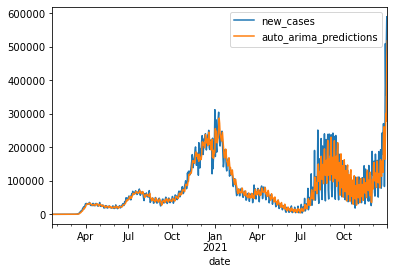

In [352]:
predictions = USA_auto_arima_model.predict_in_sample()
USA_train_imputed['auto_arima_predictions'] = (predictions)
USA_train_imputed.plot(y=["new_cases", "auto_arima_predictions"])

In [353]:
rmse = np.sqrt(mean_squared_error(USA_train_target, (predictions)))
rmse

31040.88355172517

In [354]:
USA_predictions2 = USA_auto_arima_model.predict(n_periods=len(USA_test_target))
rmse = np.sqrt(mean_squared_error(USA_test_target, (USA_predictions2)))
rmse

347852.8614288678

<AxesSubplot:xlabel='date'>

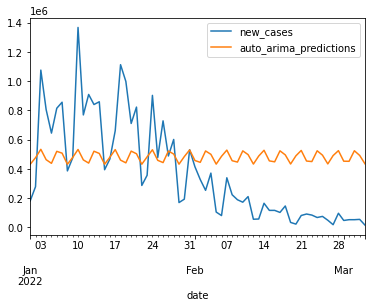

In [356]:
USA_test_imputed['auto_arima_predictions'] = (USA_predictions2)
USA_test_imputed.plot(y=["new_cases", "auto_arima_predictions"])

In [251]:
USA_train_target.to_csv("train.csv")

In [252]:
USA_test_target.to_csv("test.csv")

### BRAZIL

In [308]:
from pmdarima.arima import auto_arima

Brazil_auto_arima_model = auto_arima(Brazil_train_target, start_p=1, start_q=1,
                      test='adf',
                      max_p=7, max_q=7,
                      m=1,                       
                      seasonal=True,   
                      start_P=1, d=1, D=0,  
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=14623.610, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=14772.521, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=14774.195, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=14773.685, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=14770.523, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=14535.725, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=14715.568, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=14518.969, Time=0.16 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=14685.393, Time=0.06 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=14452.542, Time=0.23 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=14626.238, Time=0.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=14274.020, Time=0.24 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=14363.342, Time=0.13 sec
 ARIMA(6,1,1)(0,0,0)[0] intercept   : AIC=14156.890, Time=0.55 sec
 ARIMA(6,1,0)(0,0,0

<AxesSubplot:xlabel='date'>

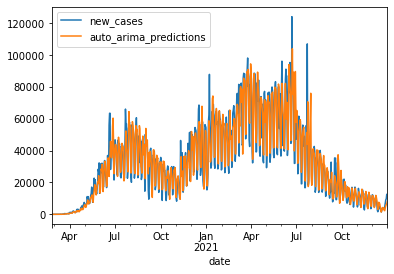

In [310]:
predictions = Brazil_auto_arima_model.predict_in_sample()
Brazil_train_imputed['auto_arima_predictions'] = predictions
Brazil_train_imputed.plot(y=["new_cases", "auto_arima_predictions"])

In [311]:
rmse = np.sqrt(mean_squared_error(Brazil_train_target, predictions))
rmse

8584.224861597211

In [312]:
Brazil_predictions2 = Brazil_auto_arima_model.predict(n_periods=len(Brazil_test_target))
rmse = np.sqrt(mean_squared_error(Brazil_test_target, Brazil_predictions2))
rmse

117761.20933884704

<AxesSubplot:xlabel='date'>

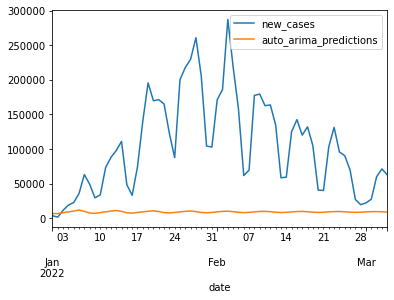

In [313]:
Brazil_test_imputed['auto_arima_predictions'] = Brazil_predictions2
Brazil_test_imputed.plot(y=["new_cases", "auto_arima_predictions"])

### GERMANY

In [314]:
from pmdarima.arima import auto_arima

Germany_auto_arima_model = auto_arima(Germany_train_target, start_p=1, start_q=1,
                      test='adf',
                      max_p=7, max_q=7,
                      m=1,                       
                      seasonal=True,   
                      start_P=1, d=1, D=0,  
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=14618.308, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=14837.939, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=14754.978, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=14644.330, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=14835.948, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=14613.164, Time=0.13 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=14752.138, Time=0.03 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=14545.170, Time=0.13 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=14711.267, Time=0.05 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=14454.180, Time=0.17 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=14605.192, Time=0.10 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=14365.732, Time=0.28 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=14446.498, Time=0.15 sec
 ARIMA(6,1,1)(0,0,0)[0] intercept   : AIC=14307.828, Time=0.50 sec
 ARIMA(6,1,0)(0,0,0

<AxesSubplot:xlabel='date'>

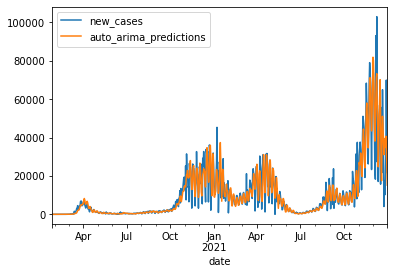

In [315]:
predictions = Germany_auto_arima_model.predict_in_sample()
Germany_train_imputed['auto_arima_predictions'] = predictions
Germany_train_imputed.plot(y=["new_cases", "auto_arima_predictions"])

In [316]:
rmse = np.sqrt(mean_squared_error(Germany_train_target, predictions))
rmse

5965.4098885721705

In [317]:
Germany_predictions2 = Germany_auto_arima_model.predict(n_periods=len(Germany_test_target))
rmse = np.sqrt(mean_squared_error(Germany_test_target, Germany_predictions2))
rmse

143596.50816257758

<AxesSubplot:xlabel='date'>

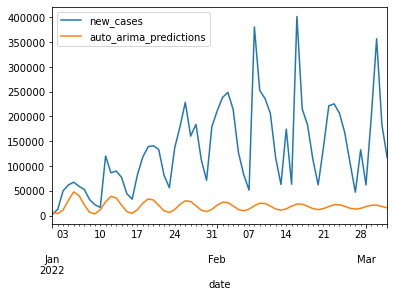

In [318]:
Germany_test_imputed['auto_arima_predictions'] = Germany_predictions2
Germany_test_imputed.plot(y=["new_cases", "auto_arima_predictions"])

### NIGERIA

In [330]:
from pmdarima.arima import auto_arima

Nigeria_auto_arima_model = auto_arima(Nigeria_train_target, start_p=1, start_q=1,
                      test='adf',
                      max_p=7, max_q=7,
                      m=1,                       
                      seasonal=True,   
                      start_P=1, d=0, D=0,  
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=9580.051, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=10166.023, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=9813.633, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=9981.002, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10484.134, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=9574.791, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=9679.819, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=9575.924, Time=0.37 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=9574.281, Time=0.33 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=9889.469, Time=0.15 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=9575.933, Time=0.43 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=9756.884, Time=0.28 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=9577.555, Time=0.51 sec
 ARIMA(1,0,2)(0,0,0)[0]             

<AxesSubplot:xlabel='date'>

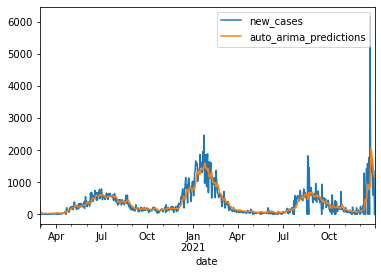

In [331]:
predictions = Nigeria_auto_arima_model.predict_in_sample()
Nigeria_train_imputed['auto_arima_predictions'] = predictions
Nigeria_train_imputed.plot(y=["new_cases", "auto_arima_predictions"])

In [332]:
rmse = np.sqrt(mean_squared_error(Nigeria_train_target, predictions))
rmse

294.8156143769186

In [333]:
Nigeria_predictions2 = Nigeria_auto_arima_model.predict(n_periods=len(Nigeria_test_target))
rmse = np.sqrt(mean_squared_error(Nigeria_test_target, Nigeria_predictions2))
rmse

521.7463915008594

<AxesSubplot:xlabel='date'>

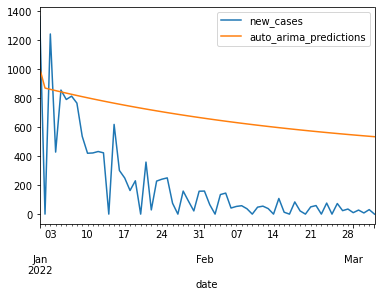

In [334]:
Nigeria_test_imputed['auto_arima_predictions'] = Nigeria_predictions2
Nigeria_test_imputed.plot(y=["new_cases", "auto_arima_predictions"])

### CHINA

In [335]:
from pmdarima.arima import auto_arima

China_auto_arima_model = auto_arima(China_train_target, start_p=1, start_q=1,
                      test='adf',
                      max_p=7, max_q=7,
                      m=1,                       
                      seasonal=True,   
                      start_P=1, d=0, D=0,  
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=11058.233, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=11435.064, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=11147.236, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=11244.705, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=11457.990, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=11054.588, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=11118.794, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=11049.284, Time=0.36 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=11078.088, Time=0.08 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=11050.900, Time=0.40 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=11050.861, Time=0.49 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=11051.045, Time=0.42 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=11060.819, Time=0.12 sec
 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=11051.592, Time=0.68 sec
 ARIMA(3,0,1)(0,0,0

<AxesSubplot:xlabel='date'>

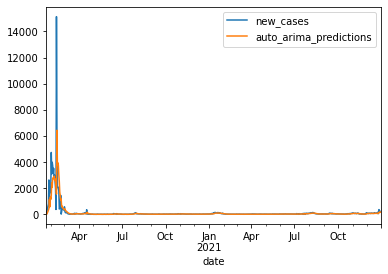

In [336]:
predictions = China_auto_arima_model.predict_in_sample()
China_train_imputed['auto_arima_predictions'] = predictions
China_train_imputed.plot(y=["new_cases", "auto_arima_predictions"])

In [337]:
rmse = np.sqrt(mean_squared_error(China_train_target, predictions))
rmse

574.735664102792

In [338]:
China_predictions2 = China_auto_arima_model.predict(n_periods=len(China_test_target))
rmse = np.sqrt(mean_squared_error(China_test_target, China_predictions2))
rmse

116.42592325492082

<AxesSubplot:xlabel='date'>

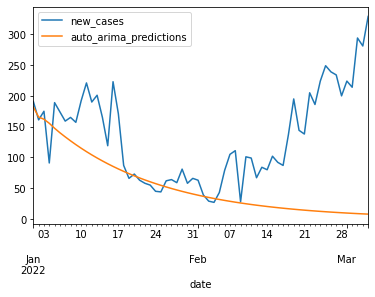

In [339]:
China_test_imputed['auto_arima_predictions'] = China_predictions2
China_test_imputed.plot(y=["new_cases", "auto_arima_predictions"])

## XGBOOST - MULTIVARIATE

### USA

In [ ]:
import xgboost as xgb
model = xgb.XGBRegressor()

# Drop constant columns
USA_multivariate_train_imputed = USA_train_imputed
USA_multivariate_train_imputed = USA_multivariate_train_imputed.drop(columns=['iso_code', 'population_density'
                                                                             ,'median_age', 'aged_65_older', 'aged_70_older',
                                                                             'gdp_per_capita','extreme_poverty',
                                                                              'cardiovasc_death_rate','hospital_beds_per_thousand',
                                                                             'life_expectancy','human_development_index','total_cases',
                                                                             'location', 'continent', 'population', 'reproduction_rate', 
                                                                              'Rolling_Mean_new_cases', 'new_cases_per_million', 'new_cases_smoothed_per_million', 'new_cases_smoothed'])
USA_multivariate_train_imputed['new_cases_Lag_7'] = USA_multivariate_train_imputed ['new_cases_Lag_7'].fillna(0)
USA_multivariate_train_imputed['new_cases_Lag_14'] = USA_multivariate_train_imputed ['new_cases_Lag_14'].fillna(0)
USA_multivariate_train_imputed["Weekend"] = USA_multivariate_train_imputed["Weekend"].astype(int)


USA_multivariate_test_imputed = USA_test_imputed
USA_multivariate_test_imputed = USA_multivariate_test_imputed.drop(columns=['iso_code', 'population_density'
                                                                             ,'median_age', 'aged_65_older', 'aged_70_older',
                                                                             'gdp_per_capita','extreme_poverty',
                                                                              'cardiovasc_death_rate','hospital_beds_per_thousand',
                                                                             'life_expectancy','human_development_index','total_cases',
                                                                             'location', 'continent', 'population', 'reproduction_rate',
                                                                           'predictions', 'auto_arima_predictions', 'Rolling_Mean_new_cases', 'new_cases_per_million', 'new_cases_smoothed_per_million', 'new_cases_smoothed'])
USA_multivariate_test_imputed['new_cases_Lag_7'][0:7] = USA_multivariate_train_imputed['new_cases'][-7:]
USA_multivariate_test_imputed['new_cases_Lag_14'][0:14] = USA_multivariate_train_imputed['new_cases'][-14:]
USA_multivariate_test_imputed["Weekend"] = USA_multivariate_test_imputed["Weekend"].astype(int)

In [ ]:
Y_data_TRAIN_USA_XGB = USA_multivariate_train_imputed['new_cases']
X_data_TRAIN_USA_XGB = USA_multivariate_train_imputed.drop(columns = ['new_cases'])
Y_data_TEST_USA_XGB = USA_multivariate_test_imputed['new_cases']
X_data_TEST_USA_XGB = USA_multivariate_test_imputed.drop(columns = ['new_cases'])

In [ ]:
from sklearn.preprocessing import StandardScaler
scalerX = StandardScaler().fit(X_data_TRAIN_USA_XGB)
X_data_TRAIN_USA_XGB_scaled = scalerX.transform(X_data_TRAIN_USA_XGB)
X_data_TEST_USA_XGB_scaled = scalerX.transform(X_data_TEST_USA_XGB)

In [ ]:
reg = xgb.XGBRegressor(objective='reg:squarederror', \
                           n_estimators=1000, \
                          nthread=24)
reg.fit(X_data_TRAIN_USA_XGB_scaled, Y_data_TRAIN_USA_XGB)

In [ ]:
USA_predictions_xgb = reg.predict(X_data_TEST_USA_XGB_scaled)
rmse = np.sqrt(mean_squared_error(USA_predictions_xgb, Y_data_TEST_USA_XGB))
rmse

In [ ]:
USA_test_imputed['xgb_predictions'] = USA_predictions_xgb
USA_test_imputed.plot(y=["new_cases", "xgb_predictions"])